# **Smart Plant Health Monitoring System**
## **Data Engineering + CNN Baseline**



## **Environment Setup & Dependencies**

In [29]:
import os, sys, zipfile, random, warnings, json
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from PIL import Image, ImageFile
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, random_split, WeightedRandomSampler
import torchvision.models as models
import torchvision.transforms as transforms
from sklearn.metrics import (classification_report, confusion_matrix,
                              accuracy_score, precision_recall_fscore_support)

warnings.filterwarnings('ignore')
ImageFile.LOAD_TRUNCATED_IMAGES = True
SEED = 42
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {DEVICE}')

Device: cuda



## **PHASE 1 — Dataset Loading & Understanding**



In [47]:
# Google Drive access on Kaggle using gdown

import subprocess
subprocess.run(['pip', 'install', '-q', 'gdown'], check=True)

import gdown
from pathlib import Path


GDRIVE_FILE_ID = '10YTIclJU7AUbVITPMJN8syJiEvq7V2VM'

# Where to save the downloaded ZIP on Kaggle
DATASET_ZIP = Path('/kaggle/working/PlantCity.zip')

if not DATASET_ZIP.exists():
    print('Downloading dataset from Google Drive...')
    gdown.download(
        f'https://drive.google.com/uc?id={GDRIVE_FILE_ID}',
        str(DATASET_ZIP),
        quiet=False
    )
    print(f'Downloaded to: {DATASET_ZIP}')
else:
    print(f'Dataset ZIP already exists: {DATASET_ZIP}')

OUTER_ZIP = DATASET_ZIP
print(f'OUTER_ZIP set to: {OUTER_ZIP}')


Downloading...
From (original): https://drive.google.com/uc?id=10YTIclJU7AUbVITPMJN8syJiEvq7V2VM
From (redirected): https://drive.google.com/uc?id=10YTIclJU7AUbVITPMJN8syJiEvq7V2VM&confirm=t&uuid=9761e310-5615-4173-9621-c122b1d7ac0f
To: /kaggle/working/PlantCity.zip
100%|██████████| 7.25G/7.25G [01:40<00:00, 72.2MB/s]

Downloaded to: /kaggle/working/PlantCity.zip
OUTER_ZIP set to: /kaggle/working/PlantCity.zip


In [48]:
# Kaggle output and working paths

from pathlib import Path

# Member 1 outputs
DRIVE_OUT = Path('/kaggle/working/PlantAI_Outputs/Member1')
DRIVE_OUT.mkdir(parents=True, exist_ok=True)
print(f'Output folder: {DRIVE_OUT}')

Output folder: /kaggle/working/PlantAI_Outputs/Member1


In [49]:
import zipfile, shutil
from pathlib import Path

OUTER_ZIP     = Path('/kaggle/working/PlantCity.zip')
EXTRACT_DIR   = Path('/kaggle/working/plantcity_dataset')
OUTER_EXTRACT = EXTRACT_DIR / 'outer'
TRAIN_EXTRACT = EXTRACT_DIR / 'train_raw'
TEST_EXTRACT  = EXTRACT_DIR / 'test_raw'

def disk():
    t, u, f = shutil.disk_usage('/kaggle/working')
    print(f"  Disk → Used: {u/1e9:.1f} GB / Free: {f/1e9:.1f} GB")

disk()

# Step 1: Extract outer ZIP to get inner ZIPs 
print("\nStep 1: Extracting PlantCity.zip → inner ZIPs only...")
OUTER_EXTRACT.mkdir(parents=True, exist_ok=True)
with zipfile.ZipFile(OUTER_ZIP, 'r') as z:
    z.extractall(OUTER_EXTRACT)
disk()

# ── Step 2: Locate inner ZIPs 
TRAIN_ZIP = next(OUTER_EXTRACT.rglob('train.zip'))
TEST_ZIP  = next(OUTER_EXTRACT.rglob('test.zip'))
print(f"\nFound: {TRAIN_ZIP}")
print(f"Found: {TEST_ZIP}")

# ── Step 3: Extract train.zip 
print("\nStep 3: Extracting train.zip...")
TRAIN_EXTRACT.mkdir(parents=True, exist_ok=True)
with zipfile.ZipFile(TRAIN_ZIP, 'r') as z:
    z.extractall(TRAIN_EXTRACT)
TRAIN_ZIP.unlink()                          
print("  train.zip extracted and deleted.")
disk()

# ── Step 4: Extract test.zip
print("\nStep 4: Extracting test.zip...")
TEST_EXTRACT.mkdir(parents=True, exist_ok=True)
with zipfile.ZipFile(TEST_ZIP, 'r') as z:
    z.extractall(TEST_EXTRACT)
TEST_ZIP.unlink()                           
print("  test.zip extracted and deleted.")
disk()

# ── Step 5: Delete outer ZIP and outer folder 
print("\nStep 5: Cleaning up...")
OUTER_ZIP.unlink()                          
shutil.rmtree(OUTER_EXTRACT)               
print("  Cleaned up.")
disk()

# ── Step 6: Verify 
print("\n=== Verification ===")
for label, path in [('train_raw', TRAIN_EXTRACT), ('test_raw', TEST_EXTRACT)]:
    subdirs = [d for d in path.rglob('*') if d.is_dir()]
    # find the level that has actual images
    img_dirs = [d for d in subdirs if any(f.suffix.lower() in {'.jpg','.jpeg','.png'} for f in d.iterdir() if f.is_file())]
    print(f"  {label}: {len(img_dirs)} class folders with images")

  Disk → Used: 7.3 GB / Free: 13.7 GB

Step 1: Extracting PlantCity.zip → inner ZIPs only...
  Disk → Used: 14.5 GB / Free: 6.4 GB

Found: /kaggle/working/plantcity_dataset/outer/PlantCity A Comprehensive Image Based on Multi Cro/Images/train.zip
Found: /kaggle/working/plantcity_dataset/outer/PlantCity A Comprehensive Image Based on Multi Cro/Images/test.zip

Step 3: Extracting train.zip...
  train.zip extracted and deleted.
  Disk → Used: 14.6 GB / Free: 6.3 GB

Step 4: Extracting test.zip...
  test.zip extracted and deleted.
  Disk → Used: 14.7 GB / Free: 6.3 GB

Step 5: Cleaning up...
  Cleaned up.
  Disk → Used: 7.4 GB / Free: 13.5 GB

=== Verification ===
  train_raw: 52 class folders with images
  test_raw: 52 class folders with images


In [50]:
from pathlib import Path
from PIL import Image
from tqdm.notebook import tqdm
import pandas as pd

VALID_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff'}

TRAIN_EXTRACT = Path('/kaggle/working/plantcity_dataset/train_raw')
TEST_EXTRACT  = Path('/kaggle/working/plantcity_dataset/test_raw')

# ── Auto-detect real class root 
def find_class_root(base):
    dirs = [d for d in base.iterdir() if d.is_dir()]
    return dirs[0] if len(dirs) == 1 else base

TRAIN_CLASS_ROOT = find_class_root(TRAIN_EXTRACT)
TEST_CLASS_ROOT  = find_class_root(TEST_EXTRACT)

print(f"Train root : {TRAIN_CLASS_ROOT}")
print(f"Test root  : {TEST_CLASS_ROOT}")

# Inventory TRAIN 
def scan(class_root, label):
    records, corrupted = [], []
    class_dirs = sorted([d for d in class_root.iterdir() if d.is_dir()])
    for class_dir in tqdm(class_dirs, desc=f'Scanning {label}'):
        for img_path in class_dir.iterdir():
            if img_path.suffix.lower() not in VALID_EXTS:
                continue
            try:
                with Image.open(img_path) as im:
                    w, h = im.size
                    mode = im.mode
                records.append({'class': class_dir.name, 'path': str(img_path),
                                'width': w, 'height': h, 'mode': mode})
            except Exception:
                corrupted.append(str(img_path))
    return pd.DataFrame(records), corrupted

df, corrupted = scan(TRAIN_CLASS_ROOT, 'train')

print(f'\nTrain Summary')
print(f'   Total images  : {len(df):,}')
print(f'   Total classes : {df["class"].nunique()}')
print(f'   Corrupted     : {len(corrupted)}')

# DATA_ROOT for all downstream cells
DATA_ROOT = TRAIN_CLASS_ROOT

Train root : /kaggle/working/plantcity_dataset/train_raw/train
Test root  : /kaggle/working/plantcity_dataset/test_raw/test


Scanning train:   0%|          | 0/52 [00:00<?, ?it/s]


Train Summary
   Total images  : 41,606
   Total classes : 52
   Corrupted     : 0


In [51]:
# 1.5  Class & Crop Mapping
def parse_class(name):
    parts = name.split('___') if '___' in name else name.split('_')
    crop = parts[0].replace('_', ' ').title()
    disease = ' '.join(parts[1:]).replace('_', ' ').title() if len(parts) > 1 else 'Unknown'
    is_healthy = 'healthy' in name.lower()
    return crop, disease, is_healthy

df[['crop', 'disease', 'is_healthy']] = df['class'].apply(
    lambda x: pd.Series(parse_class(x))
)

crops       = sorted(df['crop'].unique())
NUM_CLASSES = df['class'].nunique()

class_to_idx = {c: i for i, c in enumerate(sorted(df['class'].unique()))}
class_mapping = {'class_to_idx': class_to_idx, 'crops': crops, 'num_classes': NUM_CLASSES}

# Save class mapping to Drive
mapping_path = DRIVE_OUT / 'class_mapping.json'
with open(mapping_path, 'w') as f:
    json.dump(class_mapping, f, indent=2)
print(f'class_mapping.json saved → {mapping_path}')

class_mapping.json saved → /kaggle/working/PlantAI_Outputs/Member1/class_mapping.json


In [52]:
import pandas as pd

# Define the parse_class function
def parse_class(name):
    parts = name.split('___') if '___' in name else name.split('_')
    crop = parts[0].replace('_', ' ').title()
    disease = ' '.join(parts[1:]).replace('_', ' ').title() if len(parts) > 1 else 'Unknown'
    is_healthy = 'healthy' in name.lower()
    return crop, disease, is_healthy

df[['crop', 'disease', 'is_healthy']] = df['class'].apply(
    lambda x: pd.Series(parse_class(x))
)

# 1.6  Dataset Summary Table
summary = (
    df.groupby(['crop', 'class', 'disease', 'is_healthy'])
    .size()
    .reset_index(name='count')
    .sort_values(['crop', 'count'], ascending=[True, False])
)

print('\nFull Class Distribution Table:')
pd.set_option('display.max_rows', 60)
display(summary[['crop', 'disease', 'is_healthy', 'count']])

print(f'\nPer-class stats:')
counts = df['class'].value_counts()
print(f'   Min images/class : {counts.min()}')
print(f'   Max images/class : {counts.max()}')
print(f'   Mean             : {counts.mean():.1f}')
print(f'   Std              : {counts.std():.1f}')


Full Class Distribution Table:


,crop,disease,is_healthy,count
0,Apple Black,Spot,False,469
1,Apple Brown,Spot,False,1060
2,Apple Normal,Unknown,False,824
3,Apricot Blight Leaf Disease,Unknown,False,312
4,Apricot Normal,Unknown,False,652
5,Apricot Shot,Hole,False,832
6,Bean Bean Rust Image,Unknown,False,500
7,Bean Fungal,Leaf Disease,False,776
8,Bean Normal Leaf,Unknown,False,900
9,Bean Shot,Hole,False,392



Per-class stats:
   Min images/class : 312
   Max images/class : 1525
   Mean             : 800.1
   Std              : 368.6



## **PHASE 2 — Exploratory Data Analysis (EDA)**

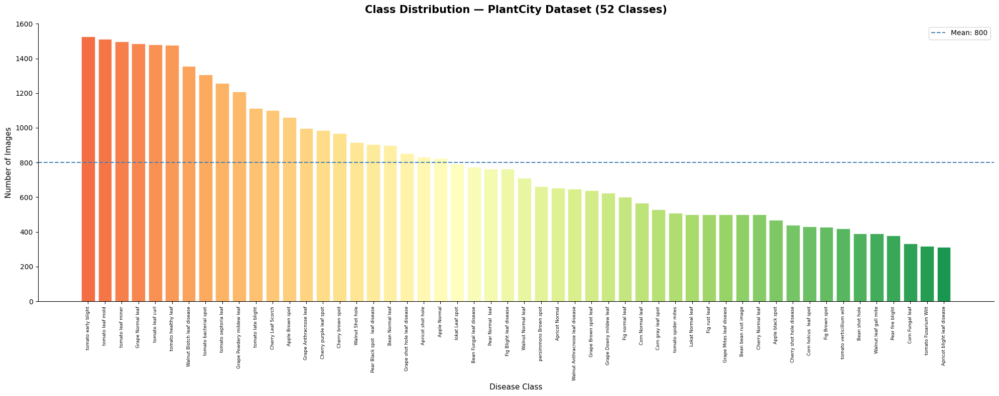

Saved eda_class_distribution.png


In [53]:
# 2.1  Class Distribution (52 classes)
fig, ax = plt.subplots(figsize=(20, 8))

counts_sorted = df['class'].value_counts().sort_values(ascending=False)
colors = plt.cm.RdYlGn(np.linspace(0.2, 0.9, len(counts_sorted)))

bars = ax.bar(range(len(counts_sorted)), counts_sorted.values, color=colors, edgecolor='white', linewidth=0.4)

ax.set_xticks(range(len(counts_sorted)))
ax.set_xticklabels([c.replace('___', '\n').replace('_', ' ') for c in counts_sorted.index],
                    rotation=90, fontsize=6.5)
ax.set_title('Class Distribution — PlantCity Dataset (52 Classes)', fontsize=15, fontweight='bold', pad=15)
ax.set_xlabel('Disease Class', fontsize=11)
ax.set_ylabel('Number of Images', fontsize=11)
ax.axhline(counts_sorted.mean(), color='steelblue', linestyle='--', linewidth=1.5,
            label=f'Mean: {counts_sorted.mean():.0f}')
ax.legend(fontsize=10)
ax.spines[['top','right']].set_visible(False)

plt.tight_layout()
_fp = DRIVE_OUT / 'eda_class_distribution.png'
plt.savefig(str(_fp), dpi=150, bbox_inches='tight')
plt.show()
print('Saved eda_class_distribution.png')

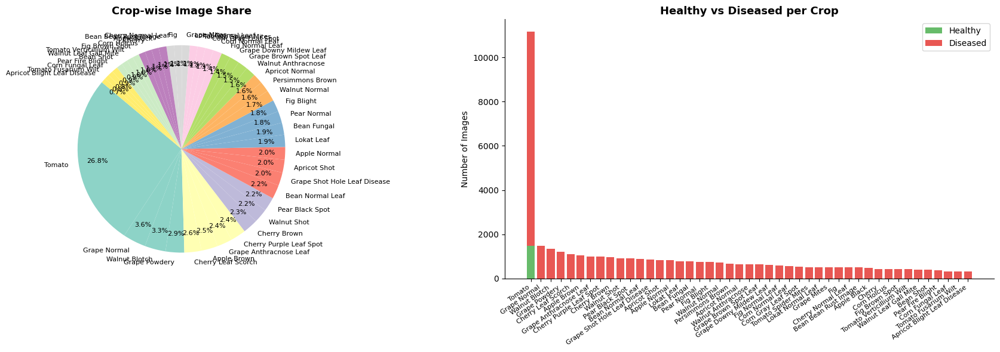

Saved eda_crop_distribution.png


<Figure size 640x480 with 0 Axes>

Saved → /kaggle/working/PlantAI_Outputs/Member1/eda_crop_distribution.png


In [54]:
# 2.2  Crop-wise Distribution
crop_counts = df.groupby('crop').size().sort_values(ascending=False)
healthy_counts = df[df['is_healthy']].groupby('crop').size()
diseased_counts = df[~df['is_healthy']].groupby('crop').size()

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Pie chart
ax = axes[0]
wedge_colors = plt.cm.Set3(np.linspace(0, 1, len(crop_counts)))
wedges, texts, autotexts = ax.pie(
    crop_counts.values, labels=crop_counts.index,
    autopct='%1.1f%%', colors=wedge_colors, startangle=140,
    textprops={'fontsize': 8}, pctdistance=0.82
)
ax.set_title('Crop-wise Image Share', fontsize=13, fontweight='bold')

# Stacked bar: healthy vs diseased
ax = axes[1]
x = np.arange(len(crop_counts))
h_vals = [healthy_counts.get(c, 0) for c in crop_counts.index]
d_vals = [diseased_counts.get(c, 0) for c in crop_counts.index]

ax.bar(x, h_vals, label='Healthy', color='#4CAF50', alpha=0.85)
ax.bar(x, d_vals, bottom=h_vals, label='Diseased', color='#E53935', alpha=0.85)
ax.set_xticks(x)
ax.set_xticklabels(crop_counts.index, rotation=35, ha='right', fontsize=8)
ax.set_title('Healthy vs Diseased per Crop', fontsize=13, fontweight='bold')
ax.set_ylabel('Number of Images')
ax.legend()
ax.spines[['top','right']].set_visible(False)

plt.tight_layout()
plt.savefig('/content/eda_crop_distribution.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved eda_crop_distribution.png')

_fp = DRIVE_OUT / 'eda_crop_distribution.png'
plt.savefig(str(_fp), dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved → {_fp}')

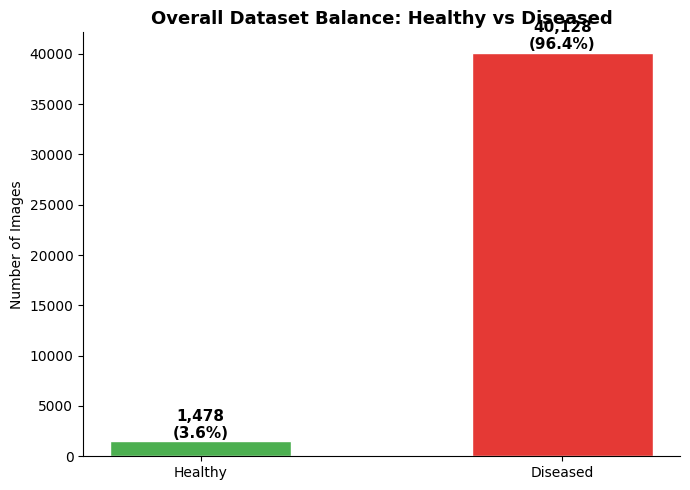

 Saved eda_healthy_vs_diseased.png


<Figure size 640x480 with 0 Axes>

Saved → /kaggle/working/PlantAI_Outputs/Member1/eda_healthy_vs_diseased.png


In [56]:
# 2.3  Overall Healthy vs Diseased
healthy_n   = df['is_healthy'].sum()
diseased_n  = len(df) - healthy_n

fig, ax = plt.subplots(figsize=(7, 5))
bars = ax.bar(['Healthy', 'Diseased'], [healthy_n, diseased_n],
               color=['#4CAF50', '#E53935'], width=0.5, edgecolor='white')
for bar, val in zip(bars, [healthy_n, diseased_n]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50,
            f'{val:,}\n({val/len(df)*100:.1f}%)', ha='center', va='bottom', fontsize=11, fontweight='bold')
ax.set_title('Overall Dataset Balance: Healthy vs Diseased', fontsize=13, fontweight='bold')
ax.set_ylabel('Number of Images')
ax.spines[['top','right']].set_visible(False)
plt.tight_layout()
plt.savefig('/content/eda_healthy_vs_diseased.png', dpi=150, bbox_inches='tight')
plt.show()
print(' Saved eda_healthy_vs_diseased.png')

_fp = DRIVE_OUT / 'eda_healthy_vs_diseased.png'
plt.savefig(str(_fp), dpi=170, bbox_inches='tight')
plt.show()
print(f'Saved → {_fp}')

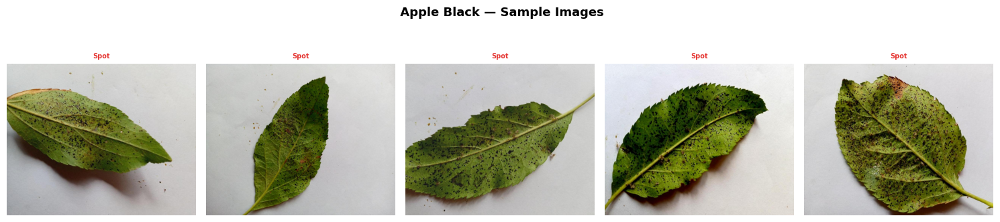

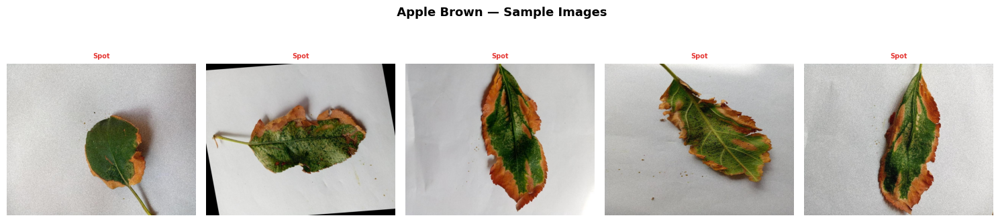

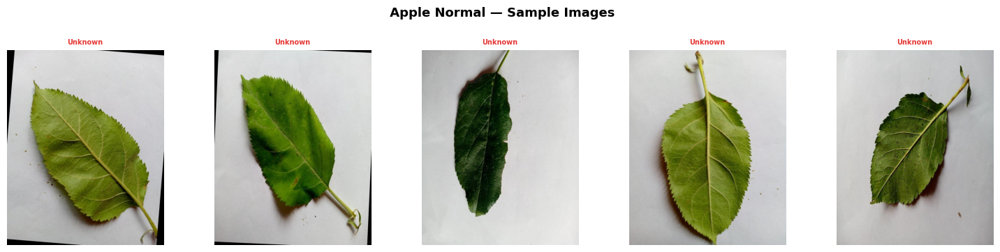

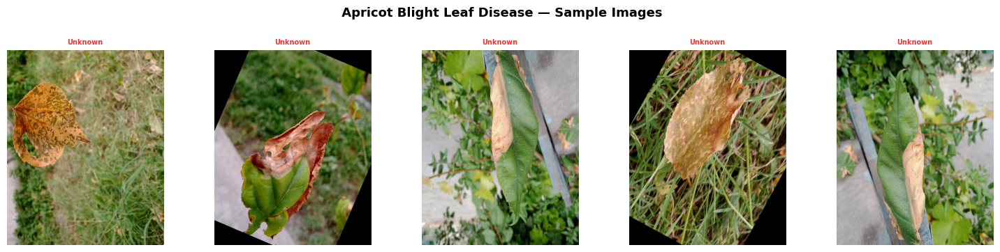

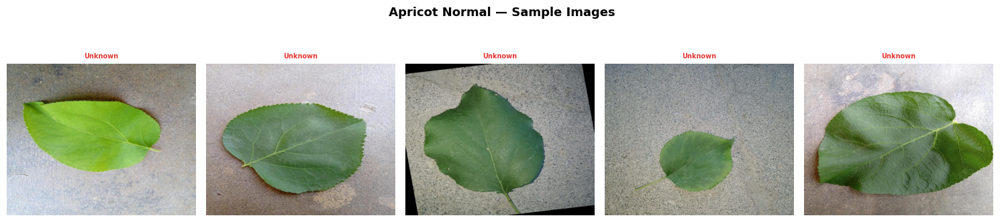

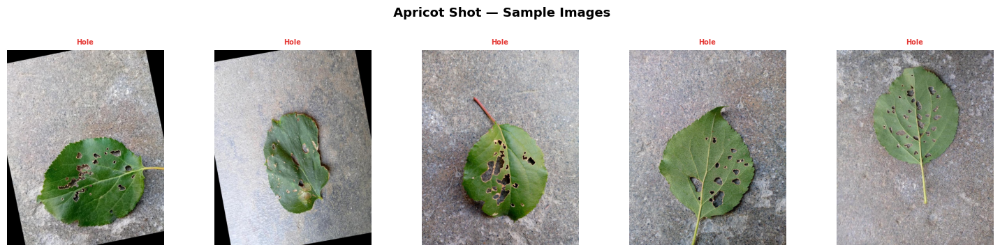

Sample image grids saved


In [10]:
# 2.4  Sample Images
N_SAMPLES = 5
crop_groups = df.groupby('crop')

for crop_name, group in list(crop_groups)[:6]:  # Show first 6 crops
    sample_rows = group.sample(min(N_SAMPLES, len(group)), random_state=SEED)
    fig, axes = plt.subplots(1, len(sample_rows), figsize=(3 * len(sample_rows), 3.5))
    if len(sample_rows) == 1:
        axes = [axes]
    fig.suptitle(f' {crop_name} — Sample Images', fontsize=13, fontweight='bold', y=1.02)

    for ax, (_, row) in zip(axes, sample_rows.iterrows()):
        try:
            img = Image.open(row['path']).convert('RGB')
            ax.imshow(img)
            label = row['disease'][:22]
            color = '#4CAF50' if row['is_healthy'] else '#E53935'
            ax.set_title(label, fontsize=7, color=color, fontweight='bold')
        except Exception:
            ax.text(0.5, 0.5, 'Load\nError', ha='center', va='center', transform=ax.transAxes)
        ax.axis('off')

    plt.tight_layout()
    plt.savefig(f'/content/eda_samples_{crop_name.lower().replace(" ","_")}.png',
                dpi=120, bbox_inches='tight')
    plt.show()

print('Sample image grids saved')

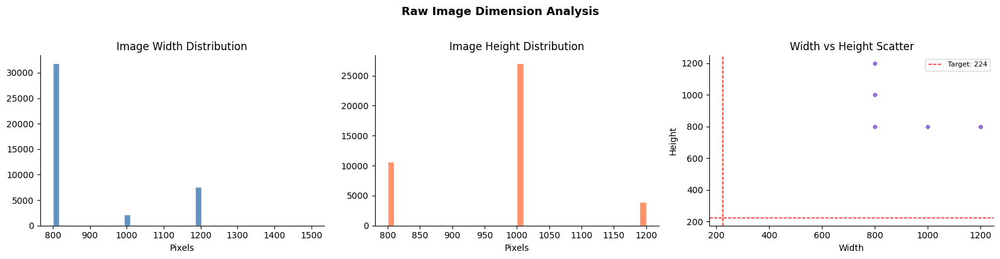

Saved eda_image_dimensions.png


<Figure size 640x480 with 0 Axes>

Saved → /kaggle/working/PlantAI_Outputs/Member1/eda_image_dimensions.png


In [57]:
# 2.5  Image Size Distribution
fig, axes = plt.subplots(1, 3, figsize=(16, 4))

axes[0].hist(df['width'],  bins=40, color='steelblue', edgecolor='white', alpha=0.85)
axes[0].set_title('Image Width Distribution');  axes[0].set_xlabel('Pixels')

axes[1].hist(df['height'], bins=40, color='coral',     edgecolor='white', alpha=0.85)
axes[1].set_title('Image Height Distribution'); axes[1].set_xlabel('Pixels')

axes[2].scatter(df['width'].sample(min(2000, len(df)), random_state=SEED),
                df['height'].sample(min(2000, len(df)), random_state=SEED),
                alpha=0.3, s=10, color='mediumpurple')
axes[2].set_title('Width vs Height Scatter'); axes[2].set_xlabel('Width'); axes[2].set_ylabel('Height')
axes[2].axvline(224, color='red', linestyle='--', linewidth=1, label='Target: 224')
axes[2].axhline(224, color='red', linestyle='--', linewidth=1)
axes[2].legend(fontsize=8)

for ax in axes:
    ax.spines[['top','right']].set_visible(False)

plt.suptitle('Raw Image Dimension Analysis', fontsize=13, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig('/content/eda_image_dimensions.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved eda_image_dimensions.png')

_fp = DRIVE_OUT / 'eda_image_dimensions.png'
plt.savefig(str(_fp), dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved → {_fp}')


## **PHASE 3 — Preprocessing Pipeline**

In [66]:
# 3.1  Transform Definitions
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]
IMG_SIZE      = 224

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE + 32, IMG_SIZE + 32)),      # Slightly larger → random crop
    transforms.RandomCrop(IMG_SIZE),                         # Random 224×224 crop
    transforms.RandomHorizontalFlip(p=0.5),                  # Horizontal flip
    transforms.RandomVerticalFlip(p=0.2),                    # Vertical flip (leaves)
    transforms.RandomRotation(degrees=20),                   # Rotation ±20°
    transforms.ColorJitter(brightness=0.3, contrast=0.3,
                            saturation=0.3, hue=0.05),       # Colour jitter
    transforms.RandomGrayscale(p=0.05),                      # Occasional grayscale
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

val_test_transform = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.1)),   # 246
    transforms.CenterCrop(IMG_SIZE),           # 224
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

print('Transform pipelines defined')
print('\n Training transforms:')
for t in train_transform.transforms:
    print(f'    {t.__class__.__name__}')
print('\n Val/Test transforms:')
for t in val_test_transform.transforms:
    print(f'   {t.__class__.__name__}')

Transform pipelines defined

 Training transforms:
    Resize
    RandomCrop
    RandomHorizontalFlip
    RandomVerticalFlip
    RandomRotation
    ColorJitter
    RandomGrayscale
    ToTensor
    Normalize

 Val/Test transforms:
   Resize
   CenterCrop
   ToTensor
   Normalize


In [67]:
from torch.utils.data import Dataset

class AugmentedSubset(Dataset):
    """Wraps a Subset and applies a different transform (e.g. augmentation) to it."""
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform

    def __len__(self):
        return len(self.subset)

    def __getitem__(self, idx):
        img, label = self.subset[idx]
        if self.transform:
       
            path, label = self.subset.dataset.samples[self.subset.indices[idx]]
            img = Image.open(path).convert('RGB')
            img = self.transform(img)
        return img, label

In [60]:
from torchvision.datasets import ImageFolder

# Training pool = original train folder only
full_train_dataset = ImageFolder(
    root=str(DATA_ROOT),           # TRAIN_CLASS_ROOT
    transform=val_test_transform
)

total   = len(full_train_dataset)
n_train = int(0.85 * total)        # 85% train, 15% val — from train pool only
n_val   = total - n_train

train_data_raw, val_data = random_split(
    full_train_dataset, [n_train, n_val],
    generator=torch.Generator().manual_seed(SEED)
)

test_dataset_clean = ImageFolder(
    root=str(TEST_CLASS_ROOT),
    transform=val_test_transform
)

# Verify class alignment
assert full_train_dataset.classes == test_dataset_clean.classes, \
    "Class mismatch between train and test folders"

# Keep full_dataset reference for sampler compatibility
full_dataset = full_train_dataset

train_dataset = AugmentedSubset(train_data_raw, train_transform)

print(f'Clean split (no leakage):')
print(f'   Train      : {n_train:,}  ({n_train/total*100:.1f}% of train pool)')
print(f'   Validation : {n_val:,}   ({n_val/total*100:.1f}% of train pool)')
print(f'   Test       : {len(test_dataset_clean):,}   (original held-out set)')
print(f'   Total seen : {total:,}')

Clean split (no leakage):
   Train      : 35,365  (85.0% of train pool)
   Validation : 6,241   (15.0% of train pool)
   Test       : 10,667   (original held-out set)
   Total seen : 41,606


In [16]:
# 3.3  Weighted Sampler for Class Imbalance
train_labels = [full_dataset.samples[i][1] for i in train_data_raw.indices]
class_counts_train = Counter(train_labels)
class_weights = {cls: 1.0 / count for cls, count in class_counts_train.items()}
sample_weights = [class_weights[label] for label in train_labels]

sampler = WeightedRandomSampler(
    weights=sample_weights, num_samples=len(sample_weights), replacement=True
)

BATCH_SIZE = 32
NUM_WORKERS = 2

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, sampler=sampler,
                          num_workers=NUM_WORKERS, pin_memory=True)
val_loader   = DataLoader(val_data,      batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)
test_loader  = DataLoader(test_dataset_clean,     batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)

print(f'DataLoaders ready | Batch size: {BATCH_SIZE}')
print(f'   Train batches : {len(train_loader)}')
print(f'   Val batches   : {len(val_loader)}')
print(f'   Test batches  : {len(test_loader)}')

DataLoaders ready | Batch size: 32
   Train batches : 1106
   Val batches   : 196
   Test batches  : 334


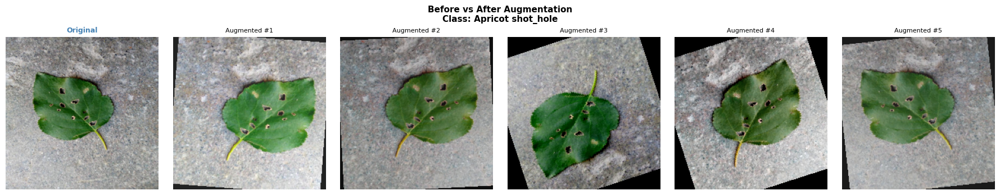

Saved preprocessing_augmentation.png


<Figure size 640x480 with 0 Axes>

Saved → /content/drive/MyDrive/PlantAI_Outputs/Member1/preprocessing_augmentation.png


In [17]:
# 3.4  Before vs After Augmentation Visualisation
def denormalize(tensor):
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std  = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    return torch.clamp(tensor * std + mean, 0, 1)

sample_idx = random.choice(train_data_raw.indices[:200])
img_path, label = full_dataset.samples[sample_idx]
raw_img = Image.open(img_path).convert('RGB')

n_aug = 5
fig, axes = plt.subplots(1, n_aug + 1, figsize=(3 * (n_aug + 1), 3.5))
fig.suptitle(f'Before vs After Augmentation\nClass: {full_dataset.classes[label]}',
             fontsize=11, fontweight='bold')

axes[0].imshow(raw_img.resize((224, 224)))
axes[0].set_title('Original', fontsize=9, color='steelblue', fontweight='bold')
axes[0].axis('off')

for i in range(1, n_aug + 1):
    aug_tensor = train_transform(raw_img)
    aug_img = denormalize(aug_tensor).permute(1, 2, 0).numpy()
    axes[i].imshow(aug_img)
    axes[i].set_title(f'Augmented #{i}', fontsize=8)
    axes[i].axis('off')

plt.tight_layout()
plt.savefig('/content/preprocessing_augmentation.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved preprocessing_augmentation.png')

_fp = DRIVE_OUT / 'preprocessing_augmentation.png'
plt.savefig(str(_fp), dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved → {_fp}')


## **PHASE 4 — CNN Baseline Model (ResNet50)**



In [18]:
#  4.1  Model Architecture
def build_resnet50_baseline(num_classes, pretrained=True):

    model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT if pretrained else None)

    # Freeze backbone 
    for name, param in model.named_parameters():
        if any(name.startswith(prefix) for prefix in ['conv1','bn1','layer1','layer2']):
            param.requires_grad = False

    # Replace classification head
    in_features = model.fc.in_features  # 2048
    model.fc = nn.Sequential(
        nn.Dropout(p=0.4),
        nn.Linear(in_features, 512),
        nn.ReLU(inplace=True),
        nn.Dropout(p=0.3),
        nn.Linear(512, num_classes)
    )
    return model

model = build_resnet50_baseline(NUM_CLASSES).to(DEVICE)

# Count parameters
total_params    = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print('ResNet50 baseline built')
print(f'   Total params    : {total_params:,}')
print(f'   Trainable params: {trainable_params:,}  ({trainable_params/total_params*100:.1f}%)')
print(f'   Input  : (B, 3, {IMG_SIZE}, {IMG_SIZE})')
print(f'   Output : (B, {NUM_CLASSES})')

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 166MB/s]


ResNet50 baseline built
   Total params    : 24,583,796
   Trainable params: 23,138,868  (94.1%)
   Input  : (B, 3, 224, 224)
   Output : (B, 52)


In [19]:
EPOCHS     = 15
LR         = 1e-4
LR_PATIENCE = 3
LR_FACTOR   = 0.5

criterion = nn.CrossEntropyLoss(label_smoothing=0.1)  # Label smoothing helps generalisation
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()),
                       lr=LR, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='max', patience=LR_PATIENCE, factor=LR_FACTOR
)

print('Training setup:')
print(f'   Criterion : CrossEntropyLoss (label_smoothing=0.1)')
print(f'   Optimizer : Adam (lr={LR}, wd=1e-4)')
print(f'   Scheduler : ReduceLROnPlateau (patience={LR_PATIENCE}, factor={LR_FACTOR})')
print(f'   Epochs    : {EPOCHS}')

Training setup:
   Criterion : CrossEntropyLoss (label_smoothing=0.1)
   Optimizer : Adam (lr=0.0001, wd=1e-4)
   Scheduler : ReduceLROnPlateau (patience=3, factor=0.5)
   Epochs    : 15


In [20]:
# 4.3  Training Loop
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}
best_val_acc  = 0.0
CHECKPOINT    = str(DRIVE_OUT / 'resnet50_best.pth')

def run_epoch(loader, training=True):
    model.train() if training else model.eval()
    total_loss, correct, total = 0.0, 0, 0

    ctx = torch.enable_grad() if training else torch.no_grad()
    with ctx:
        for imgs, labels in tqdm(loader, desc='Train' if training else 'Val  ', leave=False):
            imgs, labels = imgs.to(DEVICE, non_blocking=True), labels.to(DEVICE, non_blocking=True)
            if training:
                optimizer.zero_grad()
            logits = model(imgs)
            loss   = criterion(logits, labels)
            if training:
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                optimizer.step()
            total_loss += loss.item() * imgs.size(0)
            preds = logits.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total   += imgs.size(0)

    return total_loss / total, correct / total

print('Starting ResNet50 training ...')
for epoch in range(1, EPOCHS + 1):
    tr_loss, tr_acc = run_epoch(train_loader, training=True)
    vl_loss, vl_acc = run_epoch(val_loader,   training=False)
    scheduler.step(vl_acc)

    history['train_loss'].append(tr_loss)
    history['train_acc'].append(tr_acc)
    history['val_loss'].append(vl_loss)
    history['val_acc'].append(vl_acc)

    flag = ''
    if vl_acc > best_val_acc:
        best_val_acc = vl_acc
        torch.save(model.state_dict(), CHECKPOINT)
        flag = '  ← best'

    print(f'Epoch [{epoch:02d}/{EPOCHS}]  '
          f'Train Loss: {tr_loss:.4f}  Acc: {tr_acc*100:.2f}%  |  '
          f'Val Loss: {vl_loss:.4f}  Acc: {vl_acc*100:.2f}%{flag}')

print(f'\nTraining complete. Best val accuracy: {best_val_acc*100:.2f}%')

Starting ResNet50 training ...


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [01/15]  Train Loss: 1.4379  Acc: 79.06%  |  Val Loss: 0.8840  Acc: 94.89%  ← best


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [02/15]  Train Loss: 0.8867  Acc: 95.42%  |  Val Loss: 0.7987  Acc: 97.19%  ← best


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [03/15]  Train Loss: 0.8375  Acc: 96.83%  |  Val Loss: 0.7937  Acc: 97.91%  ← best


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [04/15]  Train Loss: 0.8155  Acc: 97.41%  |  Val Loss: 0.7720  Acc: 98.19%  ← best


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [05/15]  Train Loss: 0.8084  Acc: 97.59%  |  Val Loss: 0.7906  Acc: 97.54%


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [06/15]  Train Loss: 0.7954  Acc: 97.95%  |  Val Loss: 0.7615  Acc: 98.47%  ← best


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [07/15]  Train Loss: 0.7919  Acc: 98.04%  |  Val Loss: 0.7768  Acc: 97.99%


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [08/15]  Train Loss: 0.7921  Acc: 97.97%  |  Val Loss: 0.7777  Acc: 98.28%


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [09/15]  Train Loss: 0.7838  Acc: 98.32%  |  Val Loss: 0.7583  Acc: 98.68%  ← best


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [10/15]  Train Loss: 0.7823  Acc: 98.19%  |  Val Loss: 0.7615  Acc: 98.41%


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [11/15]  Train Loss: 0.7798  Acc: 98.33%  |  Val Loss: 0.7487  Acc: 98.78%  ← best


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [12/15]  Train Loss: 0.7801  Acc: 98.28%  |  Val Loss: 0.7543  Acc: 98.58%


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [13/15]  Train Loss: 0.7778  Acc: 98.35%  |  Val Loss: 0.7507  Acc: 98.61%


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [14/15]  Train Loss: 0.7731  Acc: 98.49%  |  Val Loss: 0.7459  Acc: 98.82%  ← best


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Epoch [15/15]  Train Loss: 0.7778  Acc: 98.31%  |  Val Loss: 0.7423  Acc: 99.02%  ← best

Training complete. Best val accuracy: 99.02%


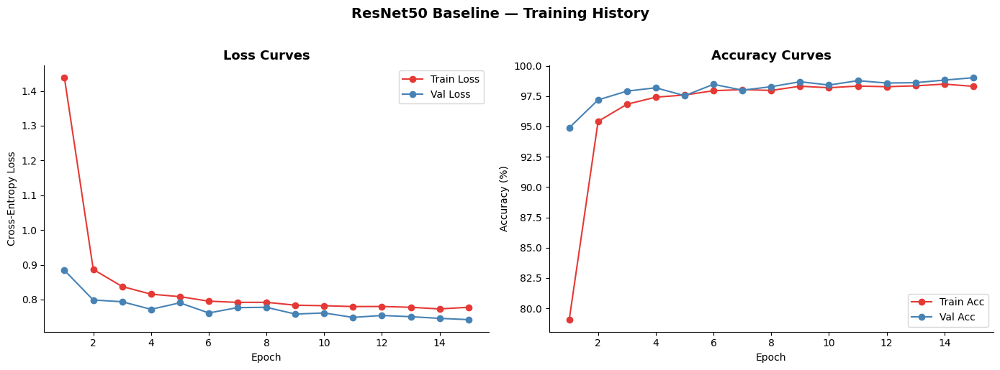

 Saved training_curves.png


In [21]:
#  4.4  Training Curves
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

epochs_range = range(1, EPOCHS + 1)

axes[0].plot(epochs_range, history['train_loss'], 'o-', color='#E53935', label='Train Loss')
axes[0].plot(epochs_range, history['val_loss'],   'o-', color='steelblue', label='Val Loss')
axes[0].set_title('Loss Curves', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epoch');  axes[0].set_ylabel('Cross-Entropy Loss')
axes[0].legend(); axes[0].spines[['top','right']].set_visible(False)

axes[1].plot(epochs_range, [a*100 for a in history['train_acc']], 'o-', color='#E53935', label='Train Acc')
axes[1].plot(epochs_range, [a*100 for a in history['val_acc']],   'o-', color='steelblue', label='Val Acc')
axes[1].set_title('Accuracy Curves', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epoch');  axes[1].set_ylabel('Accuracy (%)')
axes[1].legend(); axes[1].spines[['top','right']].set_visible(False)

plt.suptitle('ResNet50 Baseline — Training History', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
_fp = DRIVE_OUT / 'training_curves.png'
plt.savefig(str(_fp), dpi=150, bbox_inches='tight')
plt.show()
print(' Saved training_curves.png')

### **Test Set evaluation**

In [64]:
import random, warnings
import numpy as np
from pathlib import Path
from PIL import Image, ImageFile

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
import torchvision.models as models
from torchvision.datasets import ImageFolder
from torchvision.models import ResNet50_Weights
from tqdm import tqdm
from sklearn.metrics import (accuracy_score, precision_recall_fscore_support,
                              classification_report)

warnings.filterwarnings('ignore')
ImageFile.LOAD_TRUNCATED_IMAGES = True

# ── Config 
SEED        = 42
DEVICE      = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
BATCH_SIZE  = 32
IMG_SIZE    = 224
NUM_CLASSES = 52

RESNET_CKPT = '/kaggle/input/datasets/hareemfatima5/resnet-weight/resnet50_best.pth'
TEST_ROOT   = Path('/kaggle/working/plantcity_dataset/test_raw')

random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
print(f'Device     : {DEVICE}')
print(f'ResNet ckpt: {RESNET_CKPT}')

# ── Helper 
def find_class_root(base):
    dirs = [d for d in base.iterdir() if d.is_dir()]
    return dirs[0] if len(dirs) == 1 else base

# ── Dataset wrapper
class FullDataset(Dataset):
    def __init__(self, dataset, transform):
        self.dataset   = dataset
        self.transform = transform
    def __len__(self):
        return len(self.dataset)
    def __getitem__(self, idx):
        path, label = self.dataset.samples[idx]
        img = Image.open(path).convert('RGB')
        return self.transform(img), label

# ── Transform 
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

resnet_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

# ── Build test loader ────────────────────────────────────────────
test_class_root = find_class_root(TEST_ROOT)
test_base       = ImageFolder(root=str(test_class_root))
CLASS_NAMES     = test_base.classes

resnet_test   = FullDataset(test_base, resnet_transform)
resnet_loader = DataLoader(resnet_test, batch_size=BATCH_SIZE,
                           shuffle=False, num_workers=2, pin_memory=True)

print(f'\nTest images : {len(test_base):,}')
print(f'Classes     : {len(CLASS_NAMES)}')

# ── Build ResNet50 ───────────────────────────────────────────────
def build_resnet50(num_classes):
    model = models.resnet50(weights=ResNet50_Weights.DEFAULT)
    for name, param in model.named_parameters():
        if any(name.startswith(p) for p in ['conv1','bn1','layer1','layer2']):
            param.requires_grad = False
    in_features = model.fc.in_features
    model.fc = nn.Sequential(
        nn.Dropout(p=0.4),
        nn.Linear(in_features, 512),
        nn.ReLU(),
        nn.Dropout(p=0.3),
        nn.Linear(512, num_classes)
    )
    return model

resnet_model = build_resnet50(NUM_CLASSES)
resnet_ckpt  = torch.load(RESNET_CKPT, map_location=DEVICE, weights_only=False)
if isinstance(resnet_ckpt, dict) and 'model_state_dict' in resnet_ckpt:
    resnet_model.load_state_dict(resnet_ckpt['model_state_dict'])
else:
    resnet_model.load_state_dict(resnet_ckpt)
resnet_model = resnet_model.to(DEVICE)
resnet_model.eval()
print('ResNet50 weights loaded.')

# ── Evaluate 
all_preds, all_labels = [], []
with torch.no_grad():
    for imgs, labels in tqdm(resnet_loader, desc='Evaluating ResNet50'):
        preds = resnet_model(imgs.to(DEVICE)).argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

r_preds  = np.array(all_preds)
r_labels = np.array(all_labels)

resnet_acc          = accuracy_score(r_labels, r_preds)
resnet_prec, resnet_rec, resnet_f1, _ = precision_recall_fscore_support(
    r_labels, r_preds, average='weighted', zero_division=0
)

# ── Results
print('\n' + '='*60)
print('TEST SET RESULTS — ResNet50 Baseline')
print('='*60)
print(f'  Accuracy  : {resnet_acc*100:.2f}%')
print(f'  Precision : {resnet_prec*100:.2f}%  (weighted)')
print(f'  Recall    : {resnet_rec*100:.2f}%   (weighted)')
print(f'  F1-Score  : {resnet_f1*100:.2f}%   (weighted)')
print('='*60)

print('\nResNet50 Per-Class Report (top/bottom 5 by F1):')
report = classification_report(r_labels, r_preds,
                                target_names=CLASS_NAMES,
                                output_dict=True, zero_division=0)
per_class = {k: v['f1-score'] for k, v in report.items()
             if k not in ('accuracy','macro avg','weighted avg')}
sorted_f1 = sorted(per_class.items(), key=lambda x: x[1])
print('\n  Lowest F1:')
for cls, f1 in sorted_f1[:5]:
    print(f'    {cls:<45} F1={f1:.3f}')
print('\n  Highest F1:')
for cls, f1 in sorted_f1[-5:]:
    print(f'    {cls:<45} F1={f1:.3f}')

Device     : cuda
ResNet ckpt: /kaggle/input/datasets/hareemfatima5/resnet-weight/resnet50_best.pth

Test images : 10,667
Classes     : 52
Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 222MB/s]


ResNet50 weights loaded.


Evaluating ResNet50: 100%|██████████| 334/334 [01:09<00:00,  4.82it/s]


TEST SET RESULTS — ResNet50 Baseline
  Accuracy  : 99.58%
  Precision : 99.58%  (weighted)
  Recall    : 99.58%   (weighted)
  F1-Score  : 99.58%   (weighted)

ResNet50 Per-Class Report (top/bottom 5 by F1):

  Lowest F1:
    Fig_rust leaf                                 F1=0.976
    tomato verticillium wilt                      F1=0.977
    Lokat Normal leaf                             F1=0.984
    Walnut leaf gall mite                         F1=0.985
    Corn gray leaf spot                           F1=0.985

  Highest F1:
    Walnut Anthracnose_leaf disease               F1=1.000
    persimmons Brown_spot                         F1=1.000
    tomato_healthy_leaf                           F1=1.000
    tomato_leaf_curl                              F1=1.000
    tomato_leaf_miner                             F1=1.000


In [23]:
# 4.6  Per-Class Classification Report
report = classification_report(
    all_labels, all_preds,
    target_names=full_dataset.classes,
    zero_division=0
)
print('Per-Class Classification Report:\n')
print(report)

# Save to file
_rpt_path = DRIVE_OUT / 'classification_report.txt'
with open(str(_rpt_path), 'w') as f:
    f.write('ResNet50 Baseline — Classification Report\n')
    f.write('=' * 60 + '\n')
    f.write(report)
print(f'Report saved → {_rpt_path}')

📋 Per-Class Classification Report:

                                 precision    recall  f1-score   support

               Apple Brown_spot       0.99      1.00      1.00       175
                   Apple Normal       1.00      1.00      1.00       127
               Apple black_spot       1.00      1.00      1.00        67
                 Apricot Normal       1.00      1.00      1.00       108
    Apricot blight leaf disease       1.00      1.00      1.00        55
              Apricot shot_hole       1.00      1.00      1.00       127
       Bean Fungal_leaf disease       1.00      1.00      1.00       120
               Bean Normal leaf       1.00      0.99      1.00       133
           Bean bean rust image       1.00      0.98      0.99        66
                 Bean shot_hole       1.00      1.00      1.00        61
             Cherry Leaf Scorch       1.00      0.99      0.99       165
             Cherry Normal leaf       0.97      1.00      0.99        77
              

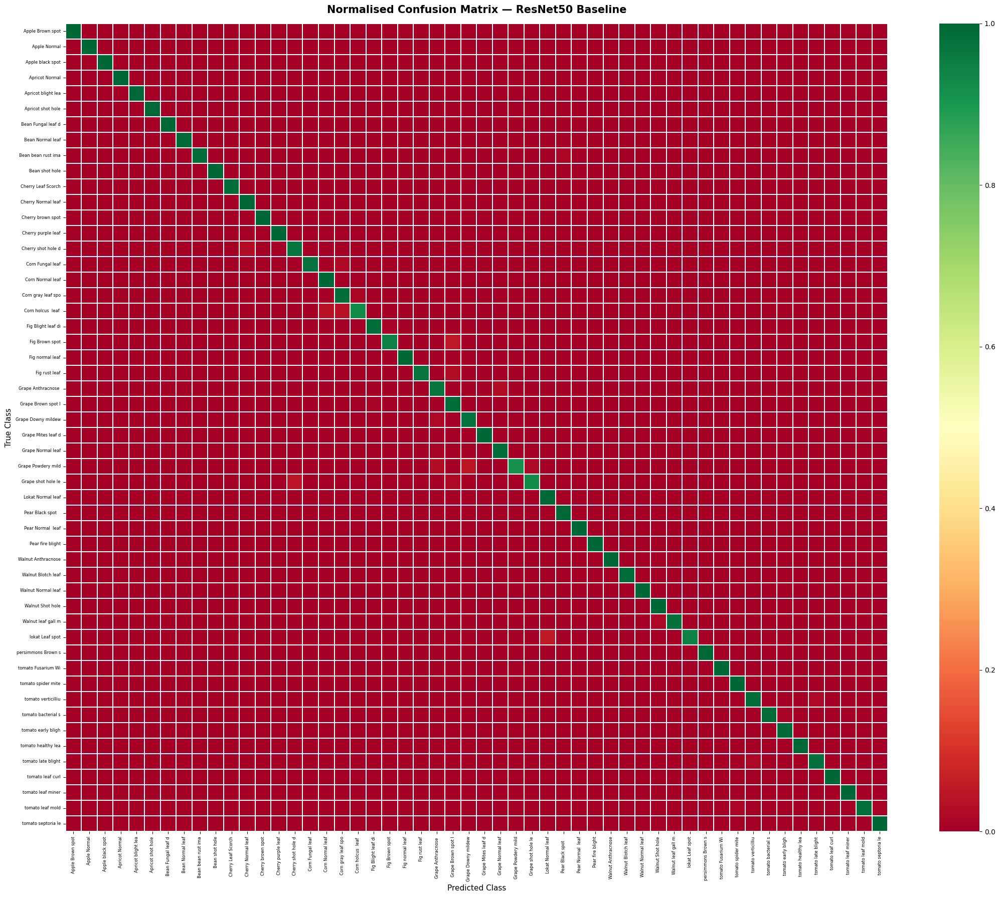

Saved confusion_matrix.png


In [24]:
# 4.7  Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_norm = cm.astype('float') / cm.sum(axis=1, keepdims=True)  # Row-normalize

fig, ax = plt.subplots(figsize=(22, 18))
sns.heatmap(
    cm_norm, annot=(NUM_CLASSES <= 30),
    fmt='.2f' if NUM_CLASSES <= 30 else '',
    cmap='RdYlGn', vmin=0, vmax=1,
    xticklabels=[c.split('___')[-1].replace('_',' ')[:18] for c in full_dataset.classes],
    yticklabels=[c.split('___')[-1].replace('_',' ')[:18] for c in full_dataset.classes],
    ax=ax, linewidths=0.3, linecolor='white'
)
ax.set_title('Normalised Confusion Matrix — ResNet50 Baseline', fontsize=15, fontweight='bold', pad=15)
ax.set_xlabel('Predicted Class', fontsize=11)
ax.set_ylabel('True Class', fontsize=11)
ax.tick_params(axis='x', rotation=90, labelsize=6)
ax.tick_params(axis='y', rotation=0,  labelsize=6)

plt.tight_layout()
_fp = DRIVE_OUT / 'confusion_matrix.png'
plt.savefig(str(_fp), dpi=150, bbox_inches='tight')
plt.show()
print('Saved confusion_matrix.png')

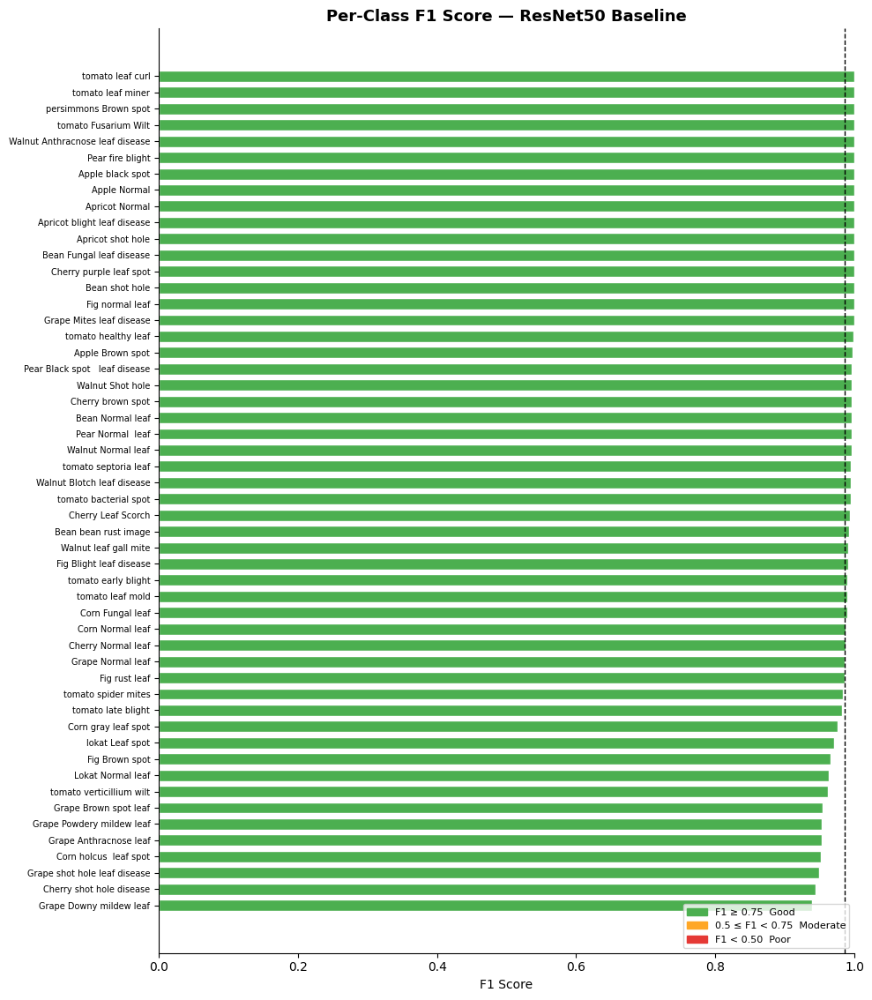

Saved → /content/drive/MyDrive/PlantAI_Outputs/Member1/per_class_f1.png


In [25]:
# 4.8  Per-Class F1 Bar Chart
_, _, f1_per_class, _ = precision_recall_fscore_support(
    all_labels, all_preds, labels=range(NUM_CLASSES), zero_division=0
)

f1_df = pd.DataFrame({
    'class': full_dataset.classes,
    'f1': f1_per_class
}).sort_values('f1', ascending=True)

fig, ax = plt.subplots(figsize=(10, max(8, NUM_CLASSES * 0.22)))
colors = ['#E53935' if v < 0.5 else '#FFA726' if v < 0.75 else '#4CAF50'
          for v in f1_df['f1']]
ax.barh(range(len(f1_df)), f1_df['f1'], color=colors, edgecolor='white', height=0.7)
ax.set_yticks(range(len(f1_df)))
ax.set_yticklabels([c.replace('___', ' / ').replace('_',' ') for c in f1_df['class']], fontsize=7)
ax.axvline(f1_df['f1'].mean(), color='black', linestyle='--', linewidth=1,
            label=f'Mean F1: {f1_df["f1"].mean():.3f}')
ax.set_title('Per-Class F1 Score — ResNet50 Baseline', fontsize=13, fontweight='bold')
ax.set_xlabel('F1 Score')
ax.set_xlim(0, 1)
ax.legend()

patches = [
    mpatches.Patch(color='#4CAF50', label='F1 ≥ 0.75  Good'),
    mpatches.Patch(color='#FFA726', label='0.5 ≤ F1 < 0.75  Moderate'),
    mpatches.Patch(color='#E53935', label='F1 < 0.50  Poor'),
]
ax.legend(handles=patches, loc='lower right', fontsize=8)
ax.spines[['top','right']].set_visible(False)

plt.tight_layout()
_fp = DRIVE_OUT / 'per_class_f1.png'
plt.savefig(str(_fp), dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved → {_fp}')

## **VISION TRANSFORMER + SEVERITY + XAI**




## **Vision Transformer (ViT) + Severity Estimation + Explainable AI (XAI)**


## **Environment Setup**

In [ ]:
# ── Install dependencies
!pip install -q torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install -q timm matplotlib seaborn scikit-learn pandas numpy Pillow tqdm opencv-python-headless

import os, sys, json, random, warnings
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
import seaborn as sns
import cv2
from PIL import Image, ImageFile
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset, random_split, WeightedRandomSampler
import torchvision
import torchvision.transforms as transforms
from torchvision import models
import timm

from sklearn.metrics import (
    classification_report, confusion_matrix,
    precision_recall_fscore_support, accuracy_score
)

ImageFile.LOAD_TRUNCATED_IMAGES = True
warnings.filterwarnings('ignore')

# ── Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Environment ready | Device: {DEVICE}')
print(f'   PyTorch    : {torch.__version__}')
print(f'   Torchvision: {torchvision.__version__}')
print(f'   timm       : {timm.__version__}')
print(f'   CUDA       : {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'   GPU        : {torch.cuda.get_device_name(0)}')

Environment ready | Device: cuda
   PyTorch    : 2.10.0+cu128
   Torchvision: 0.25.0+cu128
   timm       : 1.0.26
   CUDA       : True
   GPU        : Tesla T4


## 1. Load Shared Assets from Member 1

In [17]:
from pathlib import Path
import json

DRIVE_OUT   = Path('/kaggle/working/PlantAI_Outputs/Member1')
DATA_ROOT   = Path('/kaggle/working/plantcity_dataset/train_raw')
CLASS_MAP_PATH = DRIVE_OUT / 'class_mapping.json'
RESNET_CKPT    = DRIVE_OUT / 'resnet50_best.pth'

VIT_CKPT    = Path('/kaggle/working/vit_best.pth')
RESULTS_DIR = Path('/kaggle/working/member2_results')
RESULTS_DIR.mkdir(exist_ok=True)

# Load class mapping
with open(CLASS_MAP_PATH) as f:
    mapping = json.load(f)
class_to_idx = mapping['class_to_idx']
idx_to_class = {v: k for k, v in class_to_idx.items()} 
NUM_CLASSES  = len(class_to_idx)
CLASS_NAMES  = [idx_to_class[i] for i in range(NUM_CLASSES)]

print(f'Classes loaded  : {NUM_CLASSES}')
print(f'Results folder  : {RESULTS_DIR}')
print(f'Sample classes  : {CLASS_NAMES[:5]}')

Classes loaded  : 52
Results folder  : /kaggle/working/member2_results
Sample classes  : ['Apple Brown_spot', 'Apple Normal', 'Apple black_spot', 'Apricot Normal', 'Apricot blight leaf disease']


### **2. Data Pipeline (ViT-Specific Preprocessing)**

In [18]:
import torchvision.transforms as transforms

IMG_SIZE      = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

# Stronger augmentation for ViT
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.7, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.2),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.05),
    transforms.RandomRotation(degrees=20),
    transforms.RandomGrayscale(p=0.05),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

val_test_transform = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.1)),
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

print('Transforms defined:')
print('  Train : RandomResizedCrop + Flip + ColorJitter + Rotation + Normalize')
print('  Val/Test: Resize + CenterCrop + Normalize')

Transforms defined:
  Train : RandomResizedCrop + Flip + ColorJitter + Rotation + Normalize
  Val/Test: Resize + CenterCrop + Normalize


In [19]:
from pathlib import Path
import json

# ── All paths on Kaggle (consistent platform)
DRIVE_OUT      = Path('/kaggle/working/PlantAI_Outputs/Member1')
DATA_ROOT      = Path('/kaggle/working/plantcity_dataset/train_raw')
CLASS_MAP_PATH = DRIVE_OUT / 'class_mapping.json'
RESNET_CKPT    = DRIVE_OUT / 'resnet50_best.pth'

VIT_CKPT    = Path('/kaggle/working/vit_best.pth')
RESULTS_DIR = Path('/kaggle/working/member2_results')
RESULTS_DIR.mkdir(exist_ok=True)

# Load class mapping saved by Member 1
with open(CLASS_MAP_PATH) as f:
    mapping = json.load(f)
class_to_idx = mapping['class_to_idx']
idx_to_class = {v: k for k, v in class_to_idx.items()}
NUM_CLASSES  = len(class_to_idx)
CLASS_NAMES  = [idx_to_class[i] for i in range(NUM_CLASSES)]

print(f'Classes loaded  : {NUM_CLASSES}')
print(f'Results folder  : {RESULTS_DIR}')
print(f'Sample classes  : {CLASS_NAMES[:5]}')

# ── Dataset Split 
from torchvision.datasets import ImageFolder

def find_class_root(base):
    dirs = [d for d in base.iterdir() if d.is_dir()]
    return dirs[0] if len(dirs) == 1 else base

TRAIN_CLASS_ROOT = find_class_root(Path('/kaggle/working/plantcity_dataset/train_raw'))
TEST_CLASS_ROOT  = find_class_root(Path('/kaggle/working/plantcity_dataset/test_raw'))

full_dataset      = ImageFolder(root=str(TRAIN_CLASS_ROOT))
test_dataset_base = ImageFolder(root=str(TEST_CLASS_ROOT))

assert full_dataset.classes == test_dataset_base.classes, "Class mismatch!"

total   = len(full_dataset)
n_train = int(0.85 * total)
n_val   = total - n_train

train_raw, val_raw = random_split(
    full_dataset, [n_train, n_val],
    generator=torch.Generator().manual_seed(SEED)
)

# Wrapper so test_raw.indices works in all downstream cells
class TestSubset:
    def __init__(self, dataset):
        self.indices = list(range(len(dataset)))
        self.dataset = dataset

test_raw = TestSubset(test_dataset_base)

print(f'Train: {n_train:,} | Val: {n_val:,} | Test: {len(test_dataset_base):,} (held-out)')

# ── Per-split datasets with correct transforms
class SplitDataset(Dataset):
    def __init__(self, subset, transform):
        self.subset    = subset
        self.dataset   = subset.dataset
        self.transform = transform
    def __len__(self):  return len(self.subset)
    def __getitem__(self, idx):
        img_path, label = self.dataset.samples[self.subset.indices[idx]]
        img = Image.open(img_path).convert('RGB')
        return self.transform(img), label

class FullDataset(Dataset):
    def __init__(self, image_folder, transform):
        self.dataset   = image_folder
        self.transform = transform
    def __len__(self): return len(self.dataset)
    def __getitem__(self, idx):
        img_path, label = self.dataset.samples[idx]
        img = Image.open(img_path).convert('RGB')
        return self.transform(img), label

train_dataset = SplitDataset(train_raw,        train_transform)
val_dataset   = SplitDataset(val_raw,           val_test_transform)
test_dataset  = FullDataset(test_dataset_base,  val_test_transform)

# ── Weighted sampler for class imbalance
train_labels    = [full_dataset.samples[i][1] for i in train_raw.indices]
class_counts_tr = Counter(train_labels)
sample_weights  = [1.0 / class_counts_tr[l] for l in train_labels]
sampler         = WeightedRandomSampler(sample_weights, len(sample_weights), replacement=True)

BATCH_SIZE  = 32
NUM_WORKERS = 2

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, sampler=sampler,
                          num_workers=NUM_WORKERS, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False,
                          num_workers=NUM_WORKERS, pin_memory=True)

print(f'Split  → Train: {n_train:,}  |  Val: {n_val:,}  |  Test: {len(test_dataset_base):,}  |  Total: {total:,}')
print(f'Loaders → Train batches: {len(train_loader)} | Val: {len(val_loader)} | Test: {len(test_loader)}')

Classes loaded  : 52
Results folder  : /kaggle/working/member2_results
Sample classes  : ['Apple Brown_spot', 'Apple Normal', 'Apple black_spot', 'Apricot Normal', 'Apricot blight leaf disease']
Train: 35,365 | Val: 6,241 | Test: 10,667 (held-out)
Split  → Train: 35,365  |  Val: 6,241  |  Test: 10,667  |  Total: 41,606
Loaders → Train batches: 1106 | Val: 196 | Test: 334


## PHASE 4 — Vision Transformer (ViT-B/16)



In [ ]:
# 4.1  ViT-B/16 Architecture
def build_vit(num_classes, pretrained=True):
    
    model = timm.create_model(
        'vit_base_patch16_224',
        pretrained=pretrained,
        num_classes=num_classes,
        drop_rate=0.1,
        attn_drop_rate=0.05,
    )

    # Freeze first 8 of 12 transformer blocks
    blocks_to_freeze = list(model.blocks)[:8]
    for block in blocks_to_freeze:
        for param in block.parameters():
            param.requires_grad = False

    # Freeze patch embedding and positional embedding
    for param in model.patch_embed.parameters():
        param.requires_grad = False
    model.cls_token.requires_grad = False
    model.pos_embed.requires_grad = False

    return model


vit_model = build_vit(NUM_CLASSES).to(DEVICE)

total_p     = sum(p.numel() for p in vit_model.parameters())
trainable_p = sum(p.numel() for p in vit_model.parameters() if p.requires_grad)

print('ViT-B/16 built successfully')
print(f'   Total params     : {total_p:,}')
print(f'   Trainable params : {trainable_p:,}  ({trainable_p/total_p*100:.1f}%)')
print(f'   Patch size       : 16×16')
print(f'   Patches per image: {(IMG_SIZE//16)**2} (14×14 grid)')
print(f'   Embedding dim    : 768')
print(f'   Attention heads  : 12')
print(f'   Transformer layers: 12 (8 frozen, 4 trainable)')

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

ViT-B/16 built successfully
   Total params     : 85,838,644
   Trainable params : 28,393,012  (33.1%)
   Patch size       : 16×16
   Patches per image: 196 (14×14 grid)
   Embedding dim    : 768
   Attention heads  : 12
   Transformer layers: 12 (8 frozen, 4 trainable)


In [ ]:
# 4.3  Training Configuration
EPOCHS      = 15
LR          = 3e-5      
WEIGHT_DECAY= 0.05      # ViT standard
WARMUP_EP   = 2         # Warmup epochs before cosine decay

criterion = nn.CrossEntropyLoss(label_smoothing=0.1)

optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, vit_model.parameters()),
    lr=LR, weight_decay=WEIGHT_DECAY
)

# Cosine annealing with warmup
def lr_lambda(epoch):
    if epoch < WARMUP_EP:
        return float(epoch + 1) / float(WARMUP_EP)
    progress = (epoch - WARMUP_EP) / max(1, EPOCHS - WARMUP_EP)
    return 0.5 * (1.0 + np.cos(np.pi * progress))

scheduler = optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)

print('ViT Training Configuration:')
print(f'   Optimizer  : AdamW (lr={LR}, wd={WEIGHT_DECAY})')
print(f'   Criterion  : CrossEntropyLoss (label_smoothing=0.1)')
print(f'   Scheduler  : Cosine Decay with {WARMUP_EP}-epoch warmup')
print(f'   Epochs     : {EPOCHS}')
print(f'   Batch size : {BATCH_SIZE}')

ViT Training Configuration:
   Optimizer  : AdamW (lr=3e-05, wd=0.05)
   Criterion  : CrossEntropyLoss (label_smoothing=0.1)
   Scheduler  : Cosine Decay with 2-epoch warmup
   Epochs     : 15
   Batch size : 32


In [ ]:
# 4.4  Training Loop
history_vit = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': [], 'lr': []}
best_val_acc = 0.0

def run_epoch(model, loader, training=True):
    model.train() if training else model.eval()
    total_loss, correct, total = 0.0, 0, 0
    ctx = torch.enable_grad() if training else torch.no_grad()
    with ctx:
        for imgs, labels in tqdm(loader, desc='Train' if training else 'Val  ', leave=False):
            imgs   = imgs.to(DEVICE, non_blocking=True)
            labels = labels.to(DEVICE, non_blocking=True)
            if training:
                optimizer.zero_grad()
            logits = model(imgs)
            loss   = criterion(logits, labels)
            if training:
                loss.backward()
                nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                optimizer.step()
            total_loss += loss.item() * imgs.size(0)
            preds = logits.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total   += imgs.size(0)
    return total_loss / total, correct / total


print('Starting ViT-B/16 training...')
print('=' * 80)

for epoch in range(1, EPOCHS + 1):
    tr_loss, tr_acc = run_epoch(vit_model, train_loader, training=True)
    vl_loss, vl_acc = run_epoch(vit_model, val_loader,   training=False)
    current_lr      = optimizer.param_groups[0]['lr']
    scheduler.step()

    history_vit['train_loss'].append(tr_loss)
    history_vit['train_acc'].append(tr_acc)
    history_vit['val_loss'].append(vl_loss)
    history_vit['val_acc'].append(vl_acc)
    history_vit['lr'].append(current_lr)

    flag = ''
    if vl_acc > best_val_acc:
        best_val_acc = vl_acc
        torch.save(vit_model.state_dict(), VIT_CKPT)
        flag = '  ← BEST ✓'

    print(f'Ep [{epoch:02d}/{EPOCHS}]  '
          f'Train Loss: {tr_loss:.4f}  Acc: {tr_acc*100:.2f}%  |  '
          f'Val Loss: {vl_loss:.4f}  Acc: {vl_acc*100:.2f}%  |  '
          f'LR: {current_lr:.2e}{flag}')

print('=' * 80)
print(f'\nTraining complete. Best validation accuracy: {best_val_acc*100:.2f}%')
print(f'Best model saved → {VIT_CKPT}')

Starting ViT-B/16 training...


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [01/15]  Train Loss: 1.3259  Acc: 82.39%  |  Val Loss: 0.8970  Acc: 95.52%  |  LR: 1.50e-05  ← BEST ✓


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [02/15]  Train Loss: 0.8852  Acc: 96.03%  |  Val Loss: 0.8203  Acc: 97.20%  |  LR: 3.00e-05  ← BEST ✓


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [03/15]  Train Loss: 0.8096  Acc: 97.52%  |  Val Loss: 0.7806  Acc: 97.88%  |  LR: 3.00e-05  ← BEST ✓


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [04/15]  Train Loss: 0.7775  Acc: 98.19%  |  Val Loss: 0.7722  Acc: 98.16%  |  LR: 2.96e-05  ← BEST ✓


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [05/15]  Train Loss: 0.7615  Acc: 98.48%  |  Val Loss: 0.7567  Acc: 98.55%  |  LR: 2.83e-05  ← BEST ✓


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [06/15]  Train Loss: 0.7516  Acc: 98.79%  |  Val Loss: 0.7536  Acc: 98.56%  |  LR: 2.62e-05  ← BEST ✓


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [07/15]  Train Loss: 0.7461  Acc: 98.91%  |  Val Loss: 0.7527  Acc: 98.43%  |  LR: 2.35e-05


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [08/15]  Train Loss: 0.7391  Acc: 99.08%  |  Val Loss: 0.7404  Acc: 98.84%  |  LR: 2.03e-05  ← BEST ✓


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [09/15]  Train Loss: 0.7315  Acc: 99.29%  |  Val Loss: 0.7351  Acc: 99.06%  |  LR: 1.68e-05  ← BEST ✓


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [10/15]  Train Loss: 0.7267  Acc: 99.43%  |  Val Loss: 0.7322  Acc: 99.14%  |  LR: 1.32e-05  ← BEST ✓


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [11/15]  Train Loss: 0.7264  Acc: 99.43%  |  Val Loss: 0.7298  Acc: 99.27%  |  LR: 9.68e-06  ← BEST ✓


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [12/15]  Train Loss: 0.7219  Acc: 99.57%  |  Val Loss: 0.7274  Acc: 99.36%  |  LR: 6.48e-06  ← BEST ✓


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [13/15]  Train Loss: 0.7200  Acc: 99.62%  |  Val Loss: 0.7225  Acc: 99.38%  |  LR: 3.77e-06  ← BEST ✓


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [14/15]  Train Loss: 0.7204  Acc: 99.61%  |  Val Loss: 0.7224  Acc: 99.36%  |  LR: 1.72e-06


Train:   0%|          | 0/965 [00:00<?, ?it/s]

Val  :   0%|          | 0/207 [00:00<?, ?it/s]

Ep [15/15]  Train Loss: 0.7197  Acc: 99.61%  |  Val Loss: 0.7221  Acc: 99.41%  |  LR: 4.36e-07  ← BEST ✓

Training complete. Best validation accuracy: 99.41%
Best model saved → /content/vit_best.pth


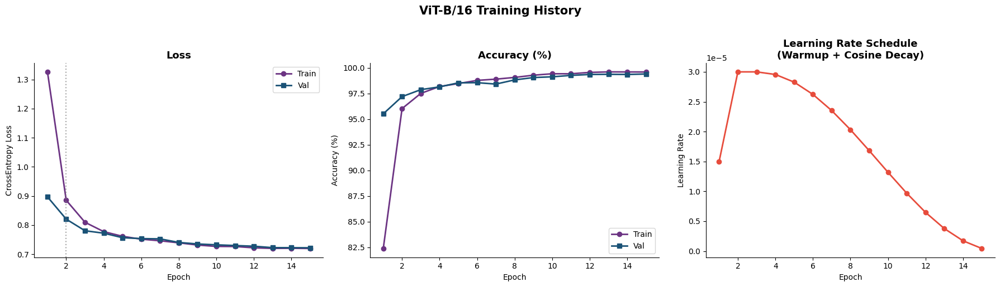

Saved vit_training_curves.png


In [ ]:
# 4.5  ViT Training Curves
import matplotlib.pyplot as plt

EPOCHS = 15
WARMUP_EP = 2

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
epochs_range = range(1, EPOCHS + 1)

# Loss
axes[0].plot(epochs_range, history_vit['train_loss'], 'o-', color='#6C3483', lw=2, label='Train')
axes[0].plot(epochs_range, history_vit['val_loss'],   's-', color='#1A5276', lw=2, label='Val')
axes[0].set_title('Loss', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('CrossEntropy Loss')
axes[0].legend(); axes[0].spines[['top','right']].set_visible(False)
axes[0].axvline(WARMUP_EP, color='gray', linestyle=':', alpha=0.7, label='Warmup end')

# Accuracy
axes[1].plot(epochs_range, [a*100 for a in history_vit['train_acc']], 'o-', color='#6C3483', lw=2, label='Train')
axes[1].plot(epochs_range, [a*100 for a in history_vit['val_acc']],   's-', color='#1A5276', lw=2, label='Val')
axes[1].set_title('Accuracy (%)', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Accuracy (%)')
axes[1].legend(); axes[1].spines[['top','right']].set_visible(False)

# Learning Rate Schedule
axes[2].plot(epochs_range, history_vit['lr'], 'o-', color='#E74C3C', lw=2)
axes[2].set_title('Learning Rate Schedule\n(Warmup + Cosine Decay)', fontsize=13, fontweight='bold')
axes[2].set_xlabel('Epoch'); axes[2].set_ylabel('Learning Rate')
axes[2].spines[['top','right']].set_visible(False)

plt.suptitle('ViT-B/16 Training History', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'vit_training_curves.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved vit_training_curves.png')

In [ ]:
# 4.5.1  Save ViT Training History
from pathlib import Path
import json

DRIVE_OUT = Path('/content/drive/MyDrive/PlantAI_Outputs/Member1')
RESULTS_DIR = Path('/content/member2_results')
RESULTS_DIR.mkdir(exist_ok=True)

_history_path = RESULTS_DIR / 'vit_training_history.json'
with open(_history_path, 'w') as f:

    json.dump(history_vit, f, indent=2)
print(f'ViT training history saved to → {_history_path}')

ViT training history saved to → /content/member2_results/vit_training_history.json


### **Test Set evaluation**

In [65]:
import random, warnings
import numpy as np
from pathlib import Path
from PIL import Image, ImageFile

import torch
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import timm
from tqdm import tqdm
from sklearn.metrics import (accuracy_score, precision_recall_fscore_support,
                              classification_report)

warnings.filterwarnings('ignore')
ImageFile.LOAD_TRUNCATED_IMAGES = True

# ── Config ───────────────────────────────────────────────────────
SEED        = 42
DEVICE      = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
BATCH_SIZE  = 32
IMG_SIZE    = 224
NUM_CLASSES = 52

VIT_CKPT  = '/kaggle/input/datasets/hareemfatima5/vit-weights/vit_best.pth'
TEST_ROOT = Path('/kaggle/working/plantcity_dataset/test_raw')

random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
print(f'Device  : {DEVICE}')
print(f'ViT ckpt: {VIT_CKPT}')

# ── Helper ───────────────────────────────────────────────────────
def find_class_root(base):
    dirs = [d for d in base.iterdir() if d.is_dir()]
    return dirs[0] if len(dirs) == 1 else base

# ── Dataset wrapper ──────────────────────────────────────────────
class FullDataset(Dataset):
    def __init__(self, dataset, transform):
        self.dataset   = dataset
        self.transform = transform
    def __len__(self):
        return len(self.dataset)
    def __getitem__(self, idx):
        path, label = self.dataset.samples[idx]
        img = Image.open(path).convert('RGB')
        return self.transform(img), label

# ── Transform ────────────────────────────────────────────────────
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

vit_transform = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.1)),   # 246
    transforms.CenterCrop(IMG_SIZE),           # 224
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

# ── Build test loader ────────────────────────────────────────────
test_class_root = find_class_root(TEST_ROOT)
test_base       = ImageFolder(root=str(test_class_root))
CLASS_NAMES     = test_base.classes

vit_test   = FullDataset(test_base, vit_transform)
vit_loader = DataLoader(vit_test, batch_size=BATCH_SIZE,
                        shuffle=False, num_workers=2, pin_memory=True)

print(f'\nTest images : {len(test_base):,}')
print(f'Classes     : {len(CLASS_NAMES)}')

# ── Build ViT-B/16 ───────────────────────────────────────────────
vit_model = timm.create_model(
    'vit_base_patch16_224',
    pretrained=False,
    num_classes=NUM_CLASSES,
    drop_rate=0.1,
    attn_drop_rate=0.05,
)
vit_ckpt = torch.load(VIT_CKPT, map_location=DEVICE, weights_only=False)
if isinstance(vit_ckpt, dict) and 'model_state_dict' in vit_ckpt:
    vit_model.load_state_dict(vit_ckpt['model_state_dict'])
else:
    vit_model.load_state_dict(vit_ckpt)
vit_model = vit_model.to(DEVICE)
vit_model.eval()
print('ViT-B/16 weights loaded.')

# ── Evaluate ─────────────────────────────────────────────────────
all_preds, all_labels = [], []
with torch.no_grad():
    for imgs, labels in tqdm(vit_loader, desc='Evaluating ViT-B/16'):
        preds = vit_model(imgs.to(DEVICE)).argmax(dim=1).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

v_preds  = np.array(all_preds)
v_labels = np.array(all_labels)

vit_acc = accuracy_score(v_labels, v_preds)
vit_prec, vit_rec, vit_f1, _ = precision_recall_fscore_support(
    v_labels, v_preds, average='weighted', zero_division=0
)

# ── Results ──────────────────────────────────────────────────────
print('\n' + '='*60)
print('TEST SET RESULTS — ViT-B/16')
print('='*60)
print(f'  Accuracy  : {vit_acc*100:.2f}%')
print(f'  Precision : {vit_prec*100:.2f}%  (weighted)')
print(f'  Recall    : {vit_rec*100:.2f}%   (weighted)')
print(f'  F1-Score  : {vit_f1*100:.2f}%   (weighted)')
print('='*60)

print('\nViT-B/16 Per-Class Report (top/bottom 5 by F1):')
report = classification_report(v_labels, v_preds,
                                target_names=CLASS_NAMES,
                                output_dict=True, zero_division=0)
per_class = {k: v['f1-score'] for k, v in report.items()
             if k not in ('accuracy','macro avg','weighted avg')}
sorted_f1 = sorted(per_class.items(), key=lambda x: x[1])
print('\n  Lowest F1:')
for cls, f1 in sorted_f1[:5]:
    print(f'    {cls:<45} F1={f1:.3f}')
print('\n  Highest F1:')
for cls, f1 in sorted_f1[-5:]:
    print(f'    {cls:<45} F1={f1:.3f}')

Device  : cuda
ViT ckpt: /kaggle/input/datasets/hareemfatima5/vit-weights/vit_best.pth

Test images : 10,667
Classes     : 52
ViT-B/16 weights loaded.


Evaluating ViT-B/16: 100%|██████████| 334/334 [02:09<00:00,  2.58it/s]


TEST SET RESULTS — ViT-B/16
  Accuracy  : 99.61%
  Precision : 99.61%  (weighted)
  Recall    : 99.61%   (weighted)
  F1-Score  : 99.61%   (weighted)

ViT-B/16 Per-Class Report (top/bottom 5 by F1):

  Lowest F1:
    tomato verticillium wilt                      F1=0.967
    tomato_late_blight                            F1=0.980
    Grape Brown spot leaf                         F1=0.981
    Fig Brown spot                                F1=0.982
    Lokat Normal leaf                             F1=0.984

  Highest F1:
    persimmons Brown_spot                         F1=1.000
    tomato_bacterial_spot                         F1=1.000
    tomato_healthy_leaf                           F1=1.000
    tomato_leaf_curl                              F1=1.000
    tomato_leaf_miner                             F1=1.000


In [ ]:
# 4.7  Per-Class Classification Report
report = classification_report(
    vit_labels, vit_preds,
    target_names=CLASS_NAMES,
    zero_division=0
)
print('Per-Class Classification Report:\n')
print(report)

_rpt_path = RESULTS_DIR / 'vit_classification_report.txt'
with open(_rpt_path, 'w') as f:
    f.write('ViT-B/16 — Classification Report\n')
    f.write('=' * 60 + '\n')
    f.write(report)
print(f'Report saved → {_rpt_path}')

Per-Class Classification Report:

                                 precision    recall  f1-score   support

               Apple Brown_spot       1.00      1.00      1.00       175
                   Apple Normal       1.00      1.00      1.00       127
               Apple black_spot       1.00      1.00      1.00        67
                 Apricot Normal       1.00      1.00      1.00       108
    Apricot blight leaf disease       0.98      1.00      0.99        55
              Apricot shot_hole       1.00      1.00      1.00       127
       Bean Fungal_leaf disease       1.00      1.00      1.00       120
               Bean Normal leaf       1.00      1.00      1.00       133
           Bean bean rust image       1.00      1.00      1.00        66
                 Bean shot_hole       1.00      1.00      1.00        61
             Cherry Leaf Scorch       1.00      1.00      1.00       165
             Cherry Normal leaf       1.00      0.99      0.99        77
              Ch

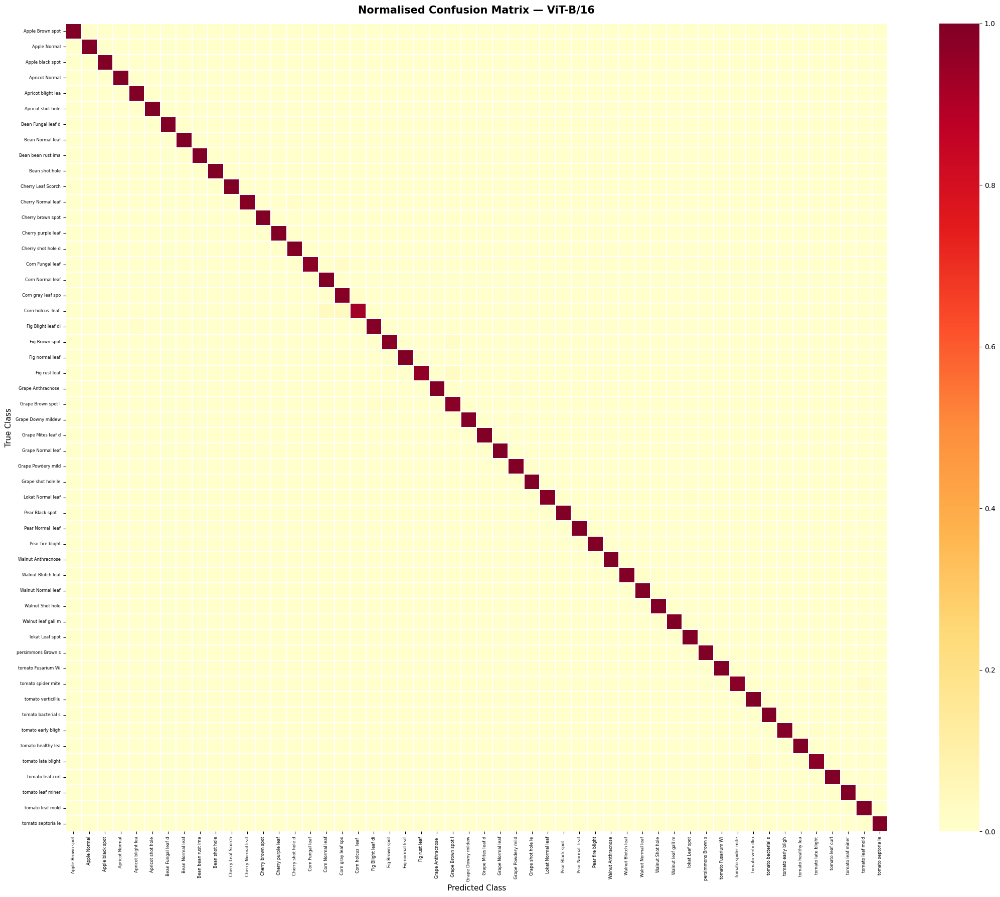

Saved vit_confusion_matrix.png


In [ ]:
# 4.8  Confusion Matrix
import seaborn as sns

cm_vit      = confusion_matrix(vit_labels, vit_preds)
cm_vit_norm = cm_vit.astype('float') / cm_vit.sum(axis=1, keepdims=True)

fig, ax = plt.subplots(figsize=(22, 18))
sns.heatmap(
    cm_vit_norm,
    annot=(NUM_CLASSES <= 30),
    fmt='.2f' if NUM_CLASSES <= 30 else '',
    cmap='YlOrRd', vmin=0, vmax=1,
    xticklabels=[c.split('___')[-1].replace('_', ' ')[:18] for c in CLASS_NAMES],
    yticklabels=[c.split('___')[-1].replace('_', ' ')[:18] for c in CLASS_NAMES],
    ax=ax, linewidths=0.3, linecolor='white'
)
ax.set_title('Normalised Confusion Matrix — ViT-B/16', fontsize=15, fontweight='bold', pad=15)
ax.set_xlabel('Predicted Class', fontsize=11)
ax.set_ylabel('True Class', fontsize=11)
ax.tick_params(axis='x', rotation=90, labelsize=6)
ax.tick_params(axis='y', rotation=0,  labelsize=6)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'vit_confusion_matrix.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved vit_confusion_matrix.png')

### **Per-Class F1 Bar Chart**

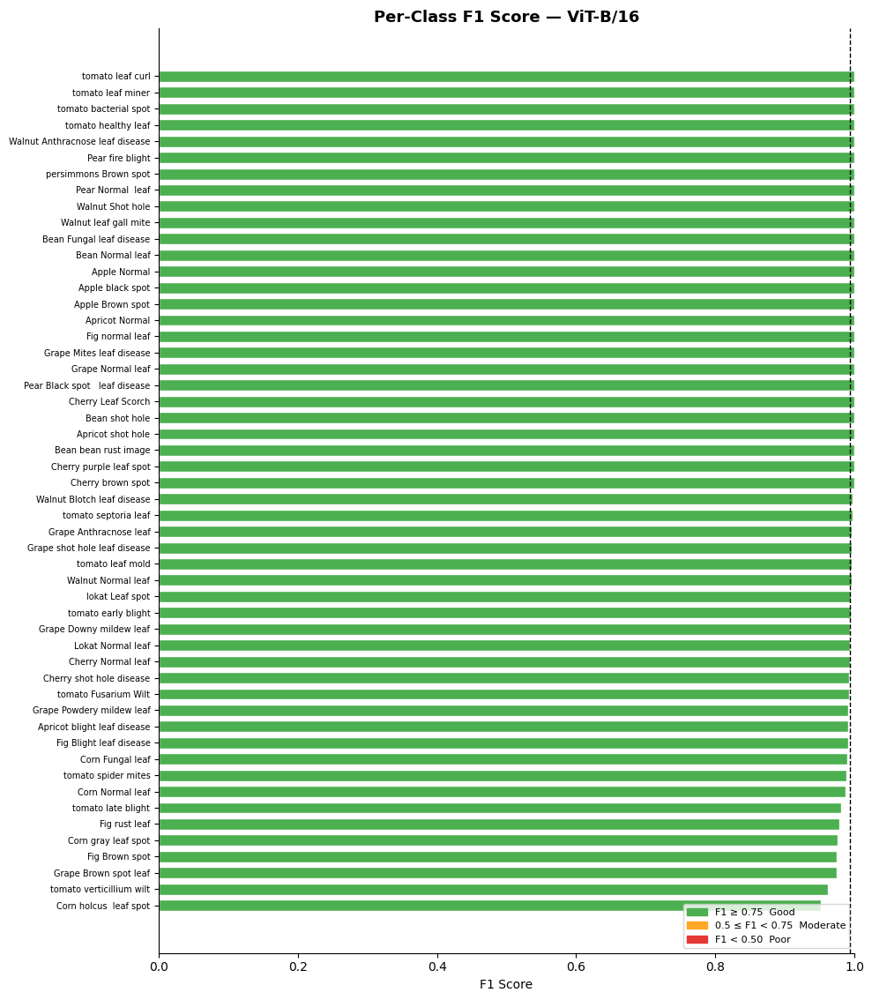

Saved vit_per_class_f1.png


In [ ]:
# 4.9  Per-Class F1 Bar Chart — ViT-B/16
import matplotlib.patches as mpatches
import pandas as pd

_, _, f1_vit_pc, _ = precision_recall_fscore_support(
    vit_labels, vit_preds, labels=range(NUM_CLASSES), zero_division=0
)

f1_df = pd.DataFrame({'class': CLASS_NAMES, 'f1': f1_vit_pc}).sort_values('f1', ascending=True)

colors_bar = ['#E53935' if v < 0.5 else '#FFA726' if v < 0.75 else '#4CAF50'
              for v in f1_df['f1']]

fig, ax = plt.subplots(figsize=(10, max(8, NUM_CLASSES * 0.22)))
ax.barh(range(len(f1_df)), f1_df['f1'], color=colors_bar, edgecolor='white', height=0.7)
ax.set_yticks(range(len(f1_df)))
ax.set_yticklabels([c.replace('___', ' / ').replace('_', ' ') for c in f1_df['class']], fontsize=7)
ax.axvline(f1_df['f1'].mean(), color='black', linestyle='--', linewidth=1,
           label=f'Mean F1: {f1_df["f1"].mean():.3f}')
ax.set_title('Per-Class F1 Score — ViT-B/16', fontsize=13, fontweight='bold')
ax.set_xlabel('F1 Score'); ax.set_xlim(0, 1)
patches = [
    mpatches.Patch(color='#4CAF50', label='F1 ≥ 0.75  Good'),
    mpatches.Patch(color='#FFA726', label='0.5 ≤ F1 < 0.75  Moderate'),
    mpatches.Patch(color='#E53935', label='F1 < 0.50  Poor'),
]
ax.legend(handles=patches, loc='lower right', fontsize=8)
ax.spines[['top', 'right']].set_visible(False)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'vit_per_class_f1.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved vit_per_class_f1.png')

## **PHASE 5 — Severity Estimation Module**




In [ ]:
# 5.1  XAI Utilities — Overlay + Denormalize
import cv2
import torch.nn.functional as F

def overlay_heatmap(img_pil, heatmap_2d, alpha=0.45, colormap=cv2.COLORMAP_JET):
    
    h, w = img_pil.height, img_pil.width
    hm   = (heatmap_2d * 255).astype(np.uint8)
    hm   = cv2.resize(hm, (w, h))
    hm   = cv2.applyColorMap(hm, colormap)
    hm   = cv2.cvtColor(hm, cv2.COLOR_BGR2RGB)
    base = np.array(img_pil.convert('RGB'))
    out  = (alpha * hm + (1 - alpha) * base).astype(np.uint8)
    from PIL import Image as _PIL
    return _PIL.fromarray(out)

def denormalize(tensor):
    """Reverse ImageNet normalisation for display."""
    mean = torch.tensor(IMAGENET_MEAN).view(3, 1, 1)
    std  = torch.tensor(IMAGENET_STD).view(3, 1, 1)
    return torch.clamp(tensor.cpu() * std + mean, 0, 1)

print('XAI utility functions ready.')

XAI utility functions ready.


In [ ]:
import importlib
import timm

# Reinstantiate a fresh model and copy weights
fresh_model = timm.create_model('vit_base_patch16_224', pretrained=False, num_classes=NUM_CLASSES)
fresh_model.load_state_dict(vit_model.state_dict())
fresh_model = fresh_model.to(DEVICE)
fresh_model.eval()
vit_model = fresh_model

print('vit_model reset with clean attention forwards.')

vit_model reset with clean attention forwards.


In [35]:
# 5.2  Attention Rollout Implementation 
def get_attention_rollout(model, img_tensor, discard_ratio=0.9):
  
    model.eval()
    attn_list = []
    hooks     = []

    def make_hook(storage):
        def hook_fn(module, input, output):
            x        = input[0]
            B, N, C  = x.shape
            nh       = module.num_heads
            head_dim = C // nh
            scale    = getattr(module, 'scale', head_dim ** -0.5)
            with torch.no_grad():
                qkv      = module.qkv(x).reshape(B, N, 3, nh, head_dim).permute(2, 0, 3, 1, 4)
                q, k, v  = qkv.unbind(0)
                attn     = (q @ k.transpose(-2, -1)) * scale
                attn     = attn.softmax(dim=-1)
                storage.append(attn.detach().cpu())
        return hook_fn

    for block in model.blocks:
        h = block.attn.register_forward_hook(make_hook(attn_list))
        hooks.append(h)

    with torch.no_grad():
        _ = model(img_tensor.unsqueeze(0).to(DEVICE))

    # Remove all hooks
    for h in hooks:
        h.remove()

    # Rollout
    result = torch.eye(attn_list[0].shape[-1])
    for attn in attn_list:
        attn_mean = attn.squeeze(0).mean(dim=0).clone()   # (N, N)
        flat      = attn_mean.flatten()
        threshold = flat.quantile(discard_ratio)
        attn_mean[attn_mean < threshold] = 0
        attn_mean = attn_mean + torch.eye(attn_mean.shape[0])
        attn_mean = attn_mean / attn_mean.sum(dim=-1, keepdim=True)
        result    = attn_mean @ result

    mask = result[0, 1:].reshape(14, 14).numpy()
    mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)
    return mask

print('get_attention_rollout defined.')

get_attention_rollout defined.


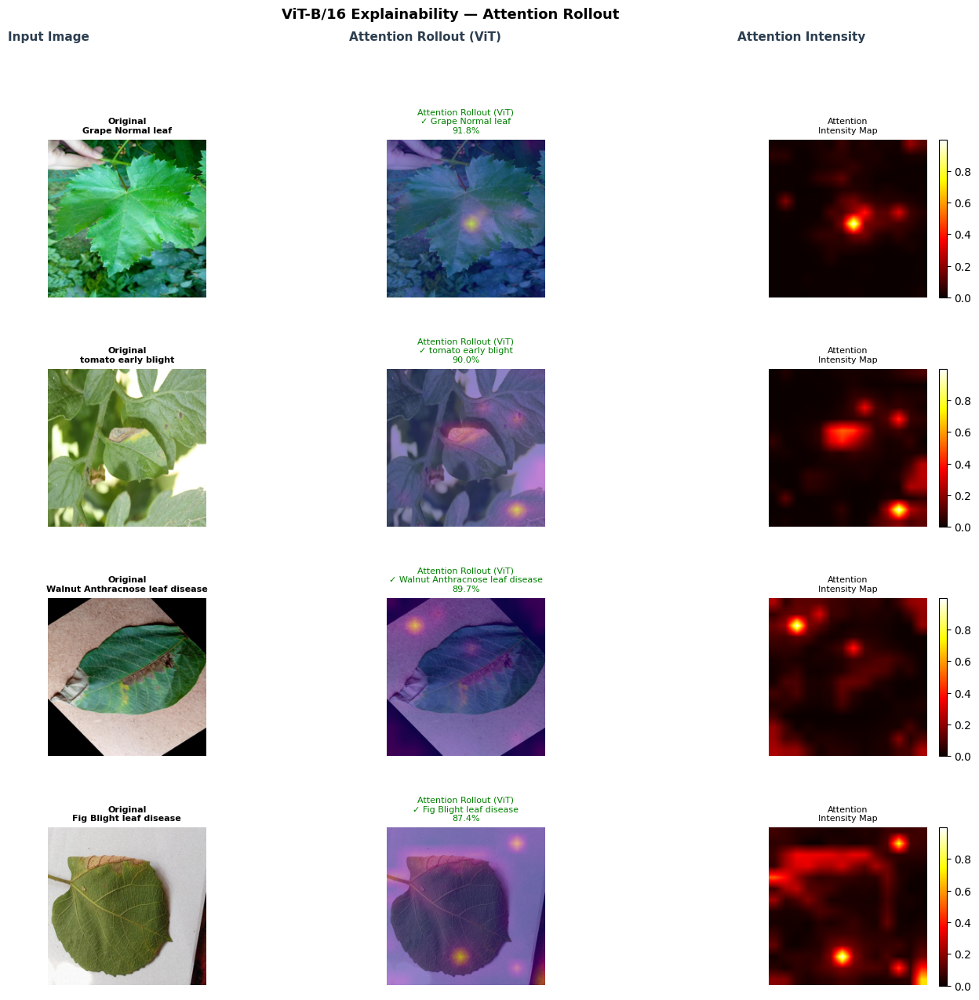

Saved vit_attention_rollout_grid.png


In [ ]:
# 5.3  XAI Grid — 4 Test Samples, Attention Rollout
import matplotlib.gridspec as gridspec
from PIL import Image as PILImage

sample_indices = random.sample(range(len(test_raw.indices)), 4)

fig = plt.figure(figsize=(16, 14))
gs  = gridspec.GridSpec(4, 3, figure=fig, hspace=0.45, wspace=0.15)

for row_idx, si in enumerate(sample_indices):
    img_path, true_label = test_dataset_base.samples[test_raw.indices[si]]
    orig_img = PILImage.open(img_path).convert('RGB').resize((224, 224))
    tensor   = val_test_transform(orig_img)

    attn_mask    = get_attention_rollout(vit_model, tensor)
    attn_overlay = overlay_heatmap(orig_img, attn_mask, alpha=0.5, colormap=cv2.COLORMAP_PLASMA)

    with torch.no_grad():
        logits       = vit_model(tensor.unsqueeze(0).to(DEVICE))
        probs        = F.softmax(logits, dim=1)
        pred_idx_vit = probs.argmax(dim=1).item()
        conf_vit     = probs[0, pred_idx_vit].item()

    true_name     = CLASS_NAMES[true_label].replace('___', '\n').replace('_', ' ')
    pred_vit_name = CLASS_NAMES[pred_idx_vit].split('___')[-1].replace('_', ' ')
    correct       = '\u2713' if pred_idx_vit == true_label else '\u2717'

    ax0 = fig.add_subplot(gs[row_idx, 0])
    ax0.imshow(orig_img)
    ax0.set_title(f'Original\n{true_name}', fontsize=8, fontweight='bold')
    ax0.axis('off')

    ax1 = fig.add_subplot(gs[row_idx, 1])
    ax1.imshow(attn_overlay)
    ax1.set_title(
        f'Attention Rollout (ViT)\n{correct} {pred_vit_name}\n{conf_vit*100:.1f}%',
        fontsize=8, color='green' if pred_idx_vit == true_label else 'red'
    )
    ax1.axis('off')

    ax2 = fig.add_subplot(gs[row_idx, 2])
    im  = ax2.imshow(attn_mask, cmap='hot', interpolation='bilinear')
    ax2.set_title('Attention\nIntensity Map', fontsize=8)
    ax2.axis('off')
    plt.colorbar(im, ax=ax2, fraction=0.046, pad=0.04)

for col, title in enumerate(['Input Image', 'Attention Rollout (ViT)', 'Attention Intensity']):
    fig.text(0.18 + col * 0.30, 0.97, title, ha='center', fontsize=11,
             fontweight='bold', color='#2C3E50')

fig.suptitle('ViT-B/16 Explainability — Attention Rollout', fontsize=13,
             fontweight='bold', y=1.0)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'vit_attention_rollout_grid.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved vit_attention_rollout_grid.png')

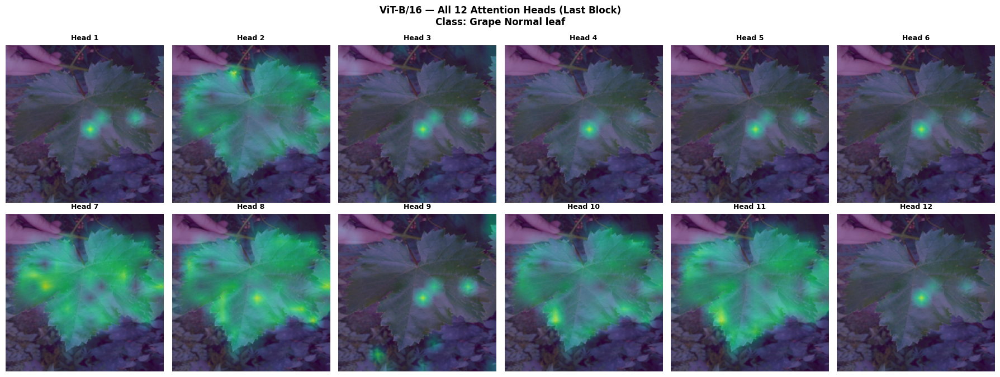

Saved vit_12_attention_heads.png


In [ ]:
# 5.4  All 12 Attention Heads 
from PIL import Image as PILImage

img_path, true_label = test_dataset_base.samples[test_raw.indices[i]]
sample_img    = PILImage.open(sample_path).convert('RGB').resize((224, 224))
sample_tensor = val_test_transform(sample_img)

last_block_attn = []

def capture_last_block(module, input, output):
    B, N, C  = input[0].shape
    nh       = module.num_heads
    head_dim = C // nh
    qkv  = module.qkv(input[0]).reshape(B, N, 3, nh, head_dim).permute(2, 0, 3, 1, 4)
    q, k, v = qkv.unbind(0)
    attn = (q @ k.transpose(-2, -1)) * module.scale
    attn = attn.softmax(dim=-1)
    last_block_attn.append(attn.detach().cpu())

hook = vit_model.blocks[-1].attn.register_forward_hook(capture_last_block)
with torch.no_grad():
    vit_model(sample_tensor.unsqueeze(0).to(DEVICE))
hook.remove()

attn_all_heads = last_block_attn[0][0]  # (12, 197, 197)
num_heads      = attn_all_heads.shape[0]

fig, axes = plt.subplots(2, 6, figsize=(18, 7))
axes = axes.flatten()

for h in range(num_heads):
    head_attn = attn_all_heads[h, 0, 1:].reshape(14, 14).numpy()
    head_attn = (head_attn - head_attn.min()) / (head_attn.max() - head_attn.min() + 1e-8)
    ov = overlay_heatmap(sample_img, head_attn, alpha=0.6, colormap=cv2.COLORMAP_VIRIDIS)
    axes[h].imshow(ov)
    axes[h].set_title(f'Head {h+1}', fontsize=9, fontweight='bold')
    axes[h].axis('off')

true_name = CLASS_NAMES[sample_label].replace('___', ' \u2014 ').replace('_', ' ')
fig.suptitle(f'ViT-B/16 \u2014 All 12 Attention Heads (Last Block)\nClass: {true_name}',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'vit_12_attention_heads.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved vit_12_attention_heads.png')

In [43]:
import torch.nn.functional as F
import cv2

class SeverityEstimatorV2:
  
    MILD_THRESHOLD     = 0.15
    MODERATE_THRESHOLD = 0.35

    def __init__(self, model, transform, device, attn_percentile=70.0):
        self.model           = model
        self.transform       = transform
        self.device          = device
        self.attn_percentile = attn_percentile 

    def segment_leaf(self, img_pil):
        img_np      = np.array(img_pil.convert('RGB'))
        img_hsv     = cv2.cvtColor(img_np, cv2.COLOR_RGB2HSV)
        mask_green  = cv2.inRange(img_hsv, np.array([25, 20,  20]), np.array([90, 255, 255]))
        mask_yellow = cv2.inRange(img_hsv, np.array([15, 30,  30]), np.array([35, 255, 255]))
        mask_brown  = cv2.inRange(img_hsv, np.array([ 5, 40,  30]), np.array([25, 255, 200]))
        leaf_mask   = cv2.bitwise_or(mask_green, cv2.bitwise_or(mask_yellow, mask_brown))
        kernel      = np.ones((7, 7), np.uint8)
        leaf_mask   = cv2.morphologyEx(leaf_mask, cv2.MORPH_CLOSE, kernel)
        leaf_mask   = cv2.morphologyEx(leaf_mask, cv2.MORPH_OPEN,  kernel)
        return (leaf_mask > 0).astype(np.float32)

    def estimate(self, img_pil):
        h, w       = img_pil.height, img_pil.width
        tensor     = self.transform(img_pil)
        with torch.no_grad():
            logits     = self.model(tensor.unsqueeze(0).to(self.device))
            probs      = F.softmax(logits, dim=1)
            pred_idx   = probs.argmax(dim=1).item()
            confidence = probs[0, pred_idx].item()

        pred_name  = CLASS_NAMES[pred_idx]
        is_healthy = 'healthy' in pred_name.lower()

        attn_map      = get_attention_rollout(self.model, tensor)
        attn_map_full = cv2.resize(attn_map, (w, h), interpolation=cv2.INTER_LINEAR)
        leaf_mask     = self.segment_leaf(img_pil)
        total_leaf_px = max(int(leaf_mask.sum()), 1)

        if is_healthy:
          
            severity_score = 0.0
            infected_px    = 0
        else:
            leaf_attn = attn_map_full[leaf_mask > 0]
            thresh    = float(np.percentile(leaf_attn, self.attn_percentile)) if len(leaf_attn) > 0 else 0.5
            infected_mask  = ((attn_map_full > thresh) * leaf_mask).astype(np.float32)
            infected_px    = int(infected_mask.sum())
            severity_score = float(infected_px / total_leaf_px)

        if is_healthy:
            label, color, emoji = 'Healthy',  '#27AE60', '🟢'
        elif severity_score < self.MILD_THRESHOLD:
            label, color, emoji = 'Mild',     '#A9DFBF', '🟡'
        elif severity_score < self.MODERATE_THRESHOLD:
            label, color, emoji = 'Moderate', '#F39C12', '🟠'
        else:
            label, color, emoji = 'Severe',   '#E74C3C', '🔴'

        return {
            'pred_idx'      : pred_idx,
            'pred_name'     : pred_name,
            'confidence'    : confidence,
            'attn_map_full' : attn_map_full,
            'leaf_mask'     : leaf_mask,
            'total_leaf_px' : total_leaf_px,
            'infected_px'   : infected_px,
            'severity_score': severity_score,
            'severity_label': label,
            'severity_color': color,
            'severity_emoji': emoji,
            'is_healthy'    : is_healthy,
        }

severity_estimator_v2 = SeverityEstimatorV2(vit_model, val_test_transform, DEVICE)
print('SeverityEstimatorV2')

SeverityEstimatorV2


In [44]:
from PIL import Image as PILImage
from collections import defaultdict
from sklearn.manifold import TSNE

from PIL import Image as PILImage
from collections import defaultdict
from sklearn.manifold import TSNE
import torch.nn.functional as F
import cv2

print('Running severity on 200 test images...')
all_sev2 = []
n_eval   = min(200, len(test_raw.indices))

for i in tqdm(range(n_eval), desc='Severity'):
    img_path, true_label = test_dataset_base.samples[test_raw.indices[i]]
    try:
        img_pil         = PILImage.open(img_path).convert('RGB').resize((224, 224))
        result          = severity_estimator_v2.estimate(img_pil)
        true_class_name = full_dataset.classes[true_label]   # fixed
        all_sev2.append({
            'true_class'    : true_class_name,
            'is_healthy_gt' : 'healthy' in true_class_name.lower() or 'normal' in true_class_name.lower(),
            'severity_score': result['severity_score'],
            'severity_label': result['severity_label'],
            'crop'          : true_class_name.split('___')[0].replace('_', ' '),
        })
    except Exception as e:
        print(f'Error at i={i}: {e}')
        continue

print(f'Collected: {len(all_sev2)}')
sev2_df = pd.DataFrame(all_sev2)

healthy_mean  = sev2_df[sev2_df['is_healthy_gt']]['severity_score'].mean()
diseased_mean = sev2_df[~sev2_df['is_healthy_gt']]['severity_score'].mean()

Running severity on 200 test images...


Severity:   0%|          | 0/200 [00:00<?, ?it/s]

Collected: 200



=== Severity Distribution ===
severity_label
Moderate    187
Healthy      13
Name: count, dtype: int64

Healthy  mean: 0.0000
Diseased mean: 0.3000
Separation   : +0.3000


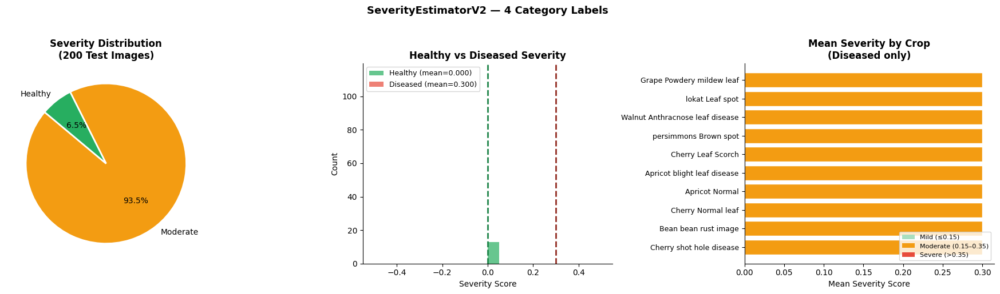

Saved → /kaggle/working/addon_results/severity_analysis.png


In [45]:
print('\n=== Severity Distribution ===')
print(sev2_df['severity_label'].value_counts())
print(f'\nHealthy  mean: {healthy_mean:.4f}')
print(f'Diseased mean: {diseased_mean:.4f}')
print(f'Separation   : {diseased_mean - healthy_mean:+.4f}')

colors_sev = {'Healthy':'#27AE60', 'Mild':'#A9DFBF', 'Moderate':'#F39C12', 'Severe':'#E74C3C'}

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot 1 — Pie chart with all 4 labels
sev_counts = sev2_df['severity_label'].value_counts()
axes[0].pie(sev_counts.values,
            labels=sev_counts.index,
            colors=[colors_sev.get(k, 'gray') for k in sev_counts.index],
            autopct='%1.1f%%', startangle=140,
            wedgeprops={'edgecolor':'white', 'linewidth':2})
axes[0].set_title('Severity Distribution\n(200 Test Images)', fontsize=12, fontweight='bold')

# Plot 2 — Histogram healthy vs diseased
axes[1].hist(sev2_df[sev2_df['is_healthy_gt']]['severity_score'],
             bins=20, color='#27AE60', alpha=0.7, label=f'Healthy (mean={healthy_mean:.3f})')
axes[1].hist(sev2_df[~sev2_df['is_healthy_gt']]['severity_score'],
             bins=20, color='#E74C3C', alpha=0.7, label=f'Diseased (mean={diseased_mean:.3f})')
axes[1].axvline(healthy_mean,  color='#1e8449', lw=2, linestyle='--')
axes[1].axvline(diseased_mean, color='#922b21', lw=2, linestyle='--')
axes[1].set_xlabel('Severity Score'); axes[1].set_ylabel('Count')
axes[1].set_title('Healthy vs Diseased Severity', fontsize=12, fontweight='bold')
axes[1].legend(fontsize=9); axes[1].spines[['top','right']].set_visible(False)

# Plot 3 — Per crop mean severity (diseased only), colored by severity level
crop_sev = (sev2_df[~sev2_df['is_healthy_gt']]
            .groupby('crop')['severity_score'].mean()
            .sort_values(ascending=False).head(10))
bar_colors = ['#E74C3C' if v>0.35 else '#F39C12' if v>0.15 else '#A9DFBF' for v in crop_sev.values]
axes[2].barh(range(len(crop_sev)), crop_sev.values, color=bar_colors, edgecolor='white')
axes[2].set_yticks(range(len(crop_sev)))
axes[2].set_yticklabels(crop_sev.index, fontsize=9)
axes[2].set_xlabel('Mean Severity Score')
axes[2].set_title('Mean Severity by Crop\n(Diseased only)', fontsize=12, fontweight='bold')
axes[2].spines[['top','right']].set_visible(False)

# Legend for bar colors
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='#A9DFBF', label='Mild (≤0.15)'),
    Patch(facecolor='#F39C12', label='Moderate (0.15–0.35)'),
    Patch(facecolor='#E74C3C', label='Severe (>0.35)'),
]
axes[2].legend(handles=legend_elements, fontsize=8, loc='lower right')

plt.suptitle('SeverityEstimatorV2 — 4 Category Labels', fontsize=13, fontweight='bold', y=1.02)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'severity_analysis.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved → {RESULTS_DIR}/severity_analysis.png')


Extracting CLS embeddings for t-SNE...
Embeddings: (1000, 768) — running t-SNE (~60s)...


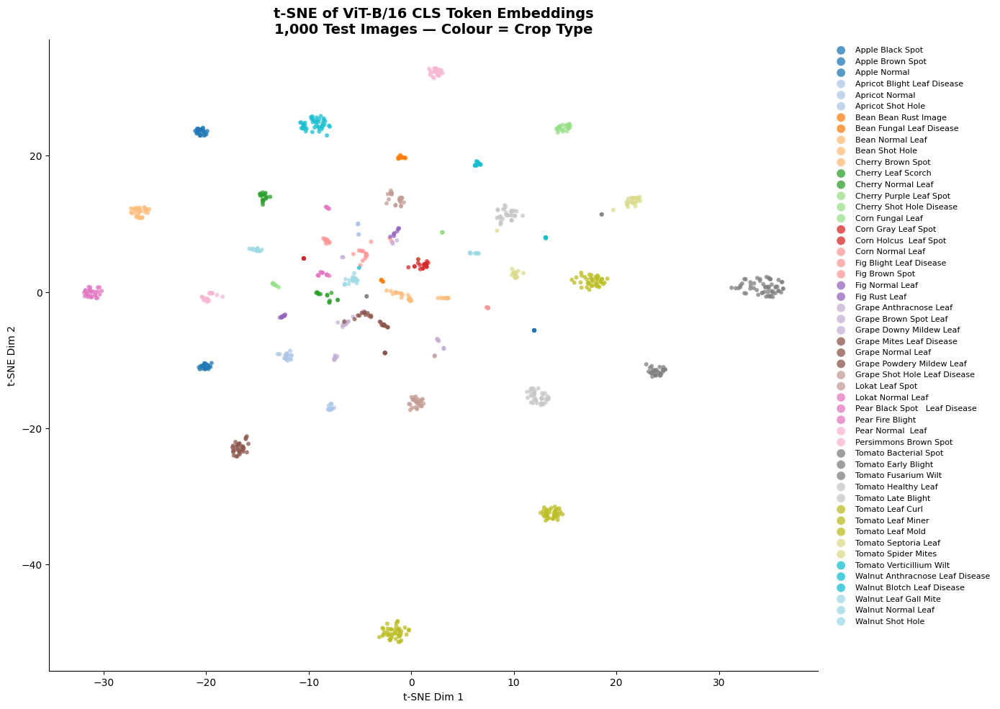

Saved → /kaggle/working/addon_results/vit_tsne_crop.png


In [38]:
# 2. t-SNE of ViT CLS embeddings
print('\nExtracting CLS embeddings for t-SNE...')
N_TSNE          = 1000
tsne_indices    = random.sample(range(len(test_raw.indices)), N_TSNE)
embeddings_list = []

def cls_hook_fn(module, input, output):
    embeddings_list.append(output[:, 0, :].detach().cpu().numpy())

hook = vit_model.blocks[-1].norm1.register_forward_hook(cls_hook_fn)
vit_model.eval()

with torch.no_grad():
    for b in range(0, N_TSNE, 64):
        batch_paths = [test_dataset_base.samples[test_raw.indices[i]][0]
               for i in tsne_indices[b:b+64]]
        batch_imgs  = torch.stack([
            val_test_transform(PILImage.open(p).convert('RGB'))
            for p in batch_paths
        ]).to(DEVICE)
        _ = vit_model(batch_imgs)

hook.remove()
feats      = np.concatenate(embeddings_list, axis=0)
labels_arr = np.array([test_dataset_base.samples[test_raw.indices[i]][1]
                        for i in tsne_indices])
print(f'Embeddings: {feats.shape} — running t-SNE (~60s)...')

tsne   = TSNE(n_components=2, perplexity=40, n_iter=1000, random_state=42, verbose=0)
coords = tsne.fit_transform(feats)

def class_to_crop(cls_name):
    return cls_name.split('___')[0].replace('_',' ').title()

crop_labels  = np.array([class_to_crop(CLASS_NAMES[l]) for l in labels_arr])
unique_crops = sorted(set(crop_labels))
cmap         = plt.cm.get_cmap('tab20', len(unique_crops))
crop_color   = {c: cmap(i) for i, c in enumerate(unique_crops)}

fig, ax = plt.subplots(figsize=(14, 10))
for crop in unique_crops:
    mask = (crop_labels == crop)
    ax.scatter(coords[mask,0], coords[mask,1],
               c=[crop_color[crop]], label=crop, s=18, alpha=0.75, edgecolors='none')
ax.set_title('t-SNE of ViT-B/16 CLS Token Embeddings\n1,000 Test Images — Colour = Crop Type',
             fontsize=14, fontweight='bold')
ax.set_xlabel('t-SNE Dim 1'); ax.set_ylabel('t-SNE Dim 2')
ax.legend(bbox_to_anchor=(1.01,1), loc='upper left', fontsize=8, markerscale=2, frameon=False)
ax.spines[['top','right']].set_visible(False)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'vit_tsne_crop.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved → {RESULTS_DIR}/vit_tsne_crop.png')

### **Per-crop accuracy + ECE calibration**

ResNet50 per-crop accuracy...


Per-crop eval:   0%|          | 0/207 [00:00<?, ?it/s]

ViT-B/16  per-crop accuracy...


Per-crop eval:   0%|          | 0/207 [00:00<?, ?it/s]

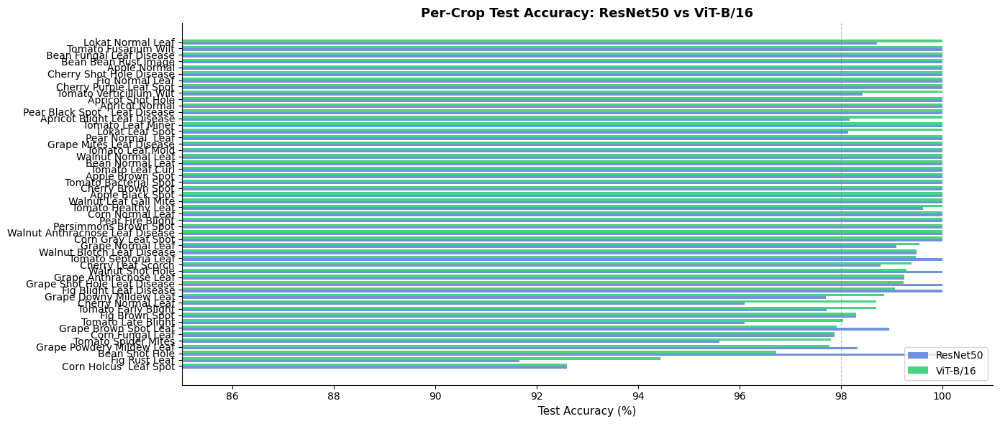

Saved → /kaggle/working/addon_results/per_crop_accuracy.png


In [42]:
# 1. Per-crop accuracy ResNet50 vs ViT
def get_per_crop_accuracy(model, dataloader, class_names, device):
    model.eval()
    crop_correct = defaultdict(int)
    crop_total   = defaultdict(int)
    with torch.no_grad():
        for imgs, labels in tqdm(dataloader, desc='Per-crop eval', leave=False):
            imgs, labels = imgs.to(device), labels.to(device)
            preds = model(imgs).argmax(dim=1)
            for p, l in zip(preds.cpu(), labels.cpu()):
                crop = class_to_crop(class_names[l.item()])
                crop_total[crop]   += 1
                crop_correct[crop] += int(p.item() == l.item())
    return {c: crop_correct[c]/crop_total[c]*100 for c in crop_total}

print('ResNet50 per-crop accuracy...')
resnet_crop_acc = get_per_crop_accuracy(resnet_model, test_loader, CLASS_NAMES, DEVICE)
print('ViT-B/16  per-crop accuracy...')
vit_crop_acc    = get_per_crop_accuracy(vit_model,    test_loader, CLASS_NAMES, DEVICE)

crops_sorted = sorted(vit_crop_acc, key=lambda c: vit_crop_acc[c])
x = np.arange(len(crops_sorted)); w = 0.38

fig, ax = plt.subplots(figsize=(14, 6))
ax.barh(x-w/2, [resnet_crop_acc.get(c,0) for c in crops_sorted],
        height=w, color='#5C85D6', label='ResNet50', alpha=0.88)
ax.barh(x+w/2, [vit_crop_acc[c]           for c in crops_sorted],
        height=w, color='#2ECC71', label='ViT-B/16', alpha=0.88)
ax.set_yticks(x); ax.set_yticklabels(crops_sorted, fontsize=10)
ax.set_xlabel('Test Accuracy (%)', fontsize=11)
ax.set_title('Per-Crop Test Accuracy: ResNet50 vs ViT-B/16', fontsize=13, fontweight='bold')
ax.axvline(98, color='gray', linestyle='--', lw=0.8, alpha=0.5)
ax.legend(fontsize=10); ax.set_xlim(85, 101)
ax.spines[['top','right']].set_visible(False)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'per_crop_accuracy.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved → {RESULTS_DIR}/per_crop_accuracy.png')



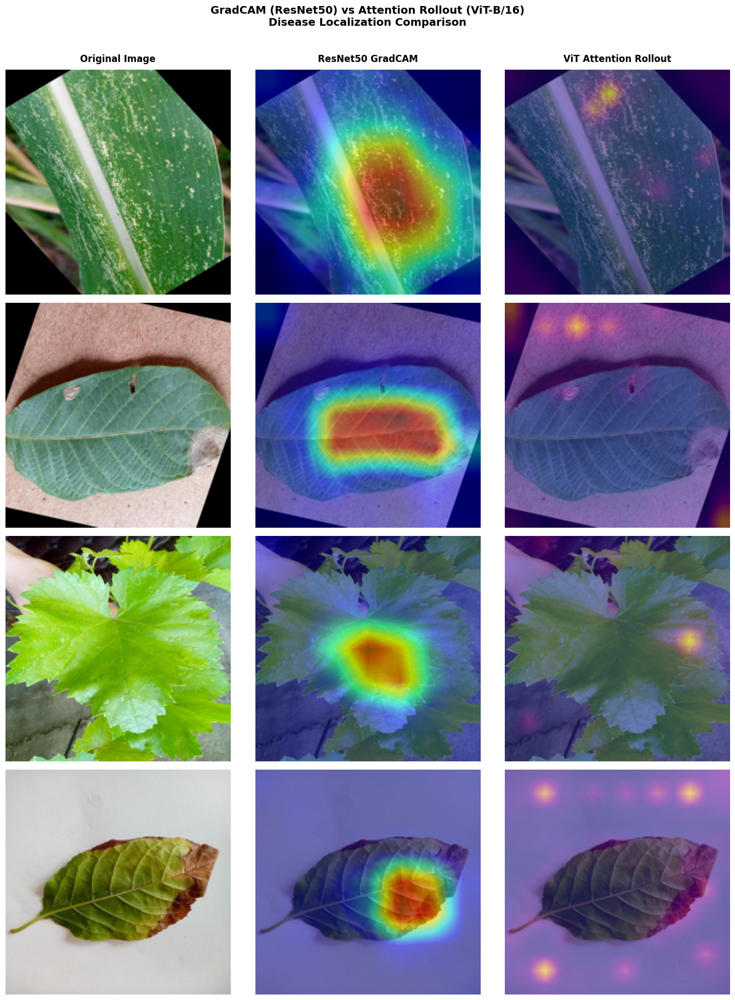

Saved → /kaggle/working/addon_results/gradcam_vs_attention_rollout.png


In [51]:
# GradCAM vs Attention Rollout Comparison
import cv2
import torch.nn.functional as F

# ── GradCAM for ResNet50 ──
class GradCAM:
    def __init__(self, model, target_layer):
        self.model       = model
        self.gradients   = None
        self.activations = None
        self.hook1 = target_layer.register_forward_hook(
            lambda m, i, o: setattr(self, 'activations', o.detach())
        )
        self.hook2 = target_layer.register_full_backward_hook(
            lambda m, gi, go: setattr(self, 'gradients', go[0].detach())
        )

    def generate(self, img_tensor, class_idx=None):
        self.model.zero_grad()
        logits = self.model(img_tensor.unsqueeze(0).to(DEVICE))
        if class_idx is None:
            class_idx = logits.argmax(dim=1).item()
        logits[0, class_idx].backward()
        weights  = self.gradients.mean(dim=[2, 3], keepdim=True)
        cam      = (weights * self.activations).sum(dim=1).squeeze()
        cam      = F.relu(cam)
        cam      = cam.cpu().numpy()
        cam      = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam

    def remove(self):
        self.hook1.remove()
        self.hook2.remove()

gradcam = GradCAM(resnet_model, resnet_model.layer4[-1])

# ── Pick 4 diseased test images ──
sample_indices = []
for i in range(len(test_raw.indices)):
    _, lbl = test_dataset_base.samples[test_raw.indices[i]]
    if 'healthy' not in full_dataset.classes[lbl].lower():
        sample_indices.append(i)
    if len(sample_indices) == 4:
        break

fig, axes = plt.subplots(4, 3, figsize=(14, 18))
col_titles = ['Original Image', 'ResNet50 GradCAM', 'ViT Attention Rollout']
for ax, title in zip(axes[0], col_titles):
    ax.set_title(title, fontsize=12, fontweight='bold', pad=10)

for row, i in enumerate(sample_indices):
    img_path, true_label = test_dataset_base.samples[test_raw.indices[i]]
    img_pil  = Image.open(img_path).convert('RGB').resize((224, 224))
    img_np   = np.array(img_pil)
    class_name = full_dataset.classes[true_label].replace('___', ' / ').replace('_', ' ')

    # --- Original ---
    axes[row, 0].imshow(img_np)
    axes[row, 0].set_ylabel(class_name, fontsize=8, rotation=0,
                             labelpad=120, va='center')
    axes[row, 0].axis('off')

    # --- GradCAM ---
    tensor = val_test_transform(img_pil)
    cam    = gradcam.generate(tensor)
    cam_resized = cv2.resize(cam, (224, 224))
    heatmap     = cv2.applyColorMap((cam_resized * 255).astype(np.uint8), cv2.COLORMAP_JET)
    heatmap     = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay     = (0.5 * heatmap + 0.5 * img_np).astype(np.uint8)
    axes[row, 1].imshow(overlay)
    axes[row, 1].axis('off')

    # --- Attention Rollout ---
    attn_map    = get_attention_rollout(vit_model, val_test_transform(img_pil))
    attn_resized = cv2.resize(attn_map, (224, 224))
    heatmap_vit  = cv2.applyColorMap((attn_resized * 255).astype(np.uint8), cv2.COLORMAP_PLASMA)
    heatmap_vit  = cv2.cvtColor(heatmap_vit, cv2.COLOR_BGR2RGB)
    overlay_vit  = (0.5 * heatmap_vit + 0.5 * img_np).astype(np.uint8)
    axes[row, 2].imshow(overlay_vit)
    axes[row, 2].axis('off')

gradcam.remove()

plt.suptitle('GradCAM (ResNet50) vs Attention Rollout (ViT-B/16)\nDisease Localization Comparison',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(RESULTS_DIR / 'gradcam_vs_attention_rollout.png', dpi=150, bbox_inches='tight')
plt.show()
print(f'Saved → {RESULTS_DIR}/gradcam_vs_attention_rollout.png')

Device : cuda
Weights: /kaggle/input/datasets/hareemfatima5/vit-weights/vit_best.pth
Test images : 10,667
Classes     : 52
Weights loaded.



Inference: 100%|██████████| 334/334 [02:04<00:00,  2.69it/s]



Test Accuracy : 99.61%

ECE before temperature scaling : 8.62%
Optimal temperature T          : 0.6215
ECE after  temperature scaling : 0.09%
ECE reduction                  : 8.53 percentage points


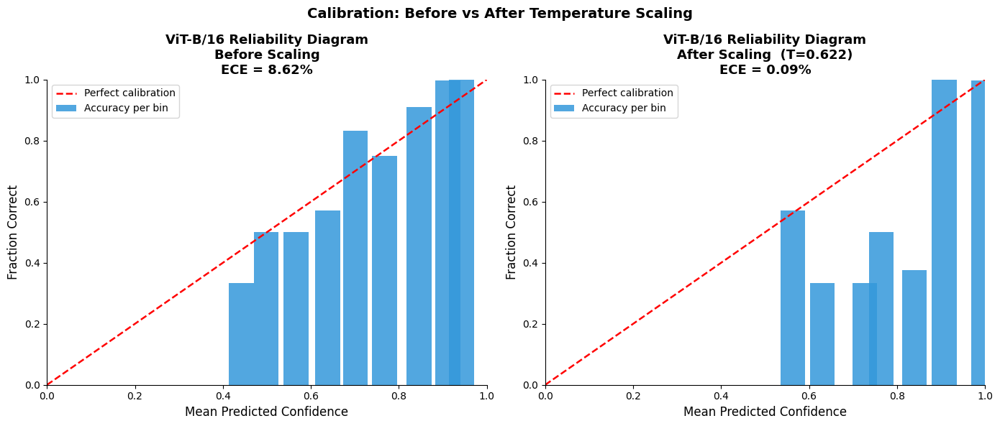


Saved → /kaggle/working/ece_results/ece_before_after.png

  CALIBRATION SUMMARY
  Test Accuracy          : 99.61%
  ECE (no scaling)       : 8.62%
  Optimal Temperature T  : 0.6215
  ECE (after scaling)    : 0.09%
  Improvement            : -8.53 pp


In [63]:
import os, random, warnings, json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path
from PIL import Image, ImageFile

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from scipy.optimize import minimize_scalar
import timm
from tqdm import tqdm

warnings.filterwarnings('ignore')
ImageFile.LOAD_TRUNCATED_IMAGES = True

# ── Config
SEED        = 42
DEVICE      = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
BATCH_SIZE  = 32
IMG_SIZE    = 224
NUM_CLASSES = 52
N_BINS      = 15

VIT_CKPT    = '/kaggle/input/datasets/hareemfatima5/vit-weights/vit_best.pth'
TEST_ROOT   = Path('/kaggle/working/plantcity_dataset/test_raw') 
OUTPUT_DIR  = Path('/kaggle/working/ece_results')
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
print(f'Device : {DEVICE}')
print(f'Weights: {VIT_CKPT}')

# ── Helper: find actual class-folder root ────────────────────────
def find_class_root(base):
    dirs = [d for d in base.iterdir() if d.is_dir()]
    return dirs[0] if len(dirs) == 1 else base

# ── Transform (same as training val/test) ────────────────────────
val_transform = transforms.Compose([
    transforms.Resize(int(IMG_SIZE * 1.1)),   # 246
    transforms.CenterCrop(IMG_SIZE),           # 224
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std =[0.229, 0.224, 0.225]),
])

# ── Dataset 
class FullDataset(Dataset):
    def __init__(self, dataset, transform):
        self.dataset   = dataset
        self.transform = transform
    def __len__(self):
        return len(self.dataset)
    def __getitem__(self, idx):
        path, label = self.dataset.samples[idx]
        img = Image.open(path).convert('RGB')
        return self.transform(img), label

test_class_root = find_class_root(TEST_ROOT)
test_base       = ImageFolder(root=str(test_class_root))
test_dataset    = FullDataset(test_base, val_transform)
test_loader     = DataLoader(test_dataset, batch_size=BATCH_SIZE,
                             shuffle=False, num_workers=2, pin_memory=True)

print(f'Test images : {len(test_dataset):,}')
print(f'Classes     : {len(test_base.classes)}')

# ── Build ViT model
model = timm.create_model(
    'vit_base_patch16_224',
    pretrained=False,
    num_classes=NUM_CLASSES,
    drop_rate=0.1,
    attn_drop_rate=0.05,
)
checkpoint = torch.load(VIT_CKPT, map_location=DEVICE, weights_only=False)
model.load_state_dict(checkpoint['model_state_dict'])
model = model.to(DEVICE)
model.eval()
print('Weights loaded.')

# ── Collect logits & labels on test set ─────────────────────────
print('\nCollecting logits...')
all_logits, all_labels = [], []

with torch.no_grad():
    for imgs, labels in tqdm(test_loader, desc='Inference'):
        logits = model(imgs.to(DEVICE)).cpu()
        all_logits.append(logits)
        all_labels.append(labels)

all_logits = torch.cat(all_logits)   # (N, 52)
all_labels = torch.cat(all_labels)   # (N,)

# Quick accuracy check
preds    = all_logits.argmax(dim=1)
accuracy = (preds == all_labels).float().mean().item() * 100
print(f'\nTest Accuracy : {accuracy:.2f}%')

# ── ECE function ─────────────────────────────────────────────────
def compute_ece(logits, labels, T=1.0, n_bins=N_BINS):
    probs      = F.softmax(logits / T, dim=1).numpy()
    conf       = probs.max(axis=1)
    pred       = probs.argmax(axis=1)
    correct    = (pred == labels.numpy()).astype(float)
    bins       = np.linspace(0, 1, n_bins + 1)
    bin_acc, bin_conf, bin_cnt = [], [], []

    for lo, hi in zip(bins[:-1], bins[1:]):
        mask = (conf >= lo) & (conf < hi)
        if mask.sum() > 0:
            bin_acc.append(correct[mask].mean())
            bin_conf.append(conf[mask].mean())
            bin_cnt.append(mask.sum())
        else:
            bin_acc.append(0.)
            bin_conf.append((lo + hi) / 2)
            bin_cnt.append(0)

    bin_acc = np.array(bin_acc)
    bin_conf = np.array(bin_conf)
    bin_cnt  = np.array(bin_cnt)
    ece = float((bin_cnt * np.abs(bin_acc - bin_conf)).sum() / bin_cnt.sum())
    return ece, bin_acc, bin_conf, bin_cnt

# ── Before temperature scaling ───────────────────────────────────
ece_before, b_acc, b_conf, b_cnt = compute_ece(all_logits, all_labels)
print(f'\nECE before temperature scaling : {ece_before*100:.2f}%')

result  = minimize_scalar(
    lambda T: compute_ece(all_logits, all_labels, T=T)[0],
    bounds=(0.01, 10.0),
    method='bounded'
)
best_T = result.x
print(f'Optimal temperature T          : {best_T:.4f}')

ece_after, ba_a, bc_a, bn_a = compute_ece(all_logits, all_labels, T=best_T)
print(f'ECE after  temperature scaling : {ece_after*100:.2f}%')
print(f'ECE reduction                  : {(ece_before - ece_after)*100:.2f} percentage points')

# ── Plot: Before vs After side by side 
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
bw = 1.0 / N_BINS

for ax, b_a, b_c, b_n, T, ece, title in [
    (axes[0], b_acc,  b_conf,  b_cnt,  1.0,   ece_before, f'Before Scaling\nECE = {ece_before*100:.2f}%'),
    (axes[1], ba_a,   bc_a,    bn_a,   best_T, ece_after,  f'After Scaling  (T={best_T:.3f})\nECE = {ece_after*100:.2f}%'),
]:
    ax.bar(b_c, b_a, width=bw * 0.85, color='#3498DB', alpha=0.85, label='Accuracy per bin')
    ax.plot([0, 1], [0, 1], 'r--', lw=1.8, label='Perfect calibration')
    ax.set_xlabel('Mean Predicted Confidence', fontsize=12)
    ax.set_ylabel('Fraction Correct', fontsize=12)
    ax.set_title(f'ViT-B/16 Reliability Diagram\n{title}', fontsize=13, fontweight='bold')
    ax.legend(fontsize=10)
    ax.set_xlim(0, 1); ax.set_ylim(0, 1)
    ax.spines[['top', 'right']].set_visible(False)

plt.suptitle('Calibration: Before vs After Temperature Scaling', fontsize=14, fontweight='bold')
plt.tight_layout()
out_path = OUTPUT_DIR / 'ece_before_after.png'
plt.savefig(out_path, dpi=150, bbox_inches='tight')
plt.show()
print(f'\nSaved → {out_path}')

# ── Summary 
print('\n' + '='*55)
print('  CALIBRATION SUMMARY')
print('='*55)
print(f'  Test Accuracy          : {accuracy:.2f}%')
print(f'  ECE (no scaling)       : {ece_before*100:.2f}%')
print(f'  Optimal Temperature T  : {best_T:.4f}')
print(f'  ECE (after scaling)    : {ece_after*100:.2f}%')
print(f'  Improvement            : -{(ece_before-ece_after)*100:.2f} pp')
print('='*55)
